# **Speech & Music classification**
- Binary classification with a data processing, review and analysis of architectures and loss functions.
- Usage of the GAN framework, which would be trained to generate sound (speech, music, or any sound)

In [1]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt
import os
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Input, Reshape, Dropout, LeakyReLU, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping



In [2]:
debussy_file = '.\datasets\music_wav\debussy.wav'

debussy, sampling_rate = librosa.load(debussy_file, sr=None)

ipd.Audio(debussy_file)

In [3]:
music_file = '.\datasets\music_wav'
speech_file = '.\datasets\speech_wav'

In [4]:
def load_data(folder):
    data = []
    for filename in os.listdir(folder):
        path = os.path.join(folder, filename)
        y, sr = librosa.load(path, sr=None)
        
        data.append(y)
        
    return np.array(data), sr


In [7]:
music_vectors, sampling_rate = load_data(music_file)
speech_vectors, _ = load_data(speech_file)

sample index: 28


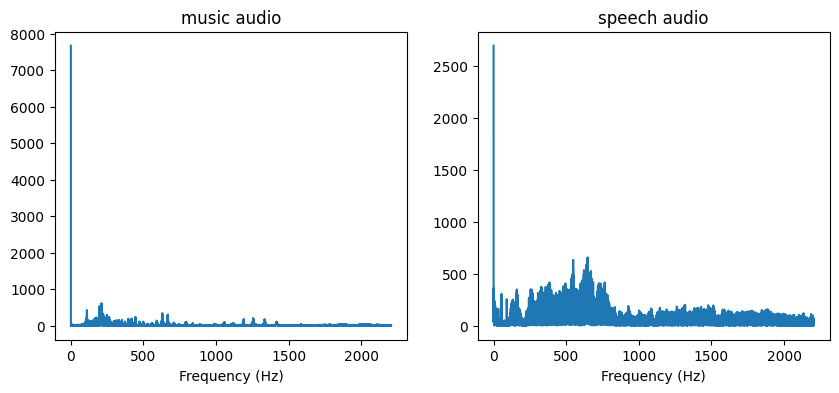

sample index: 0


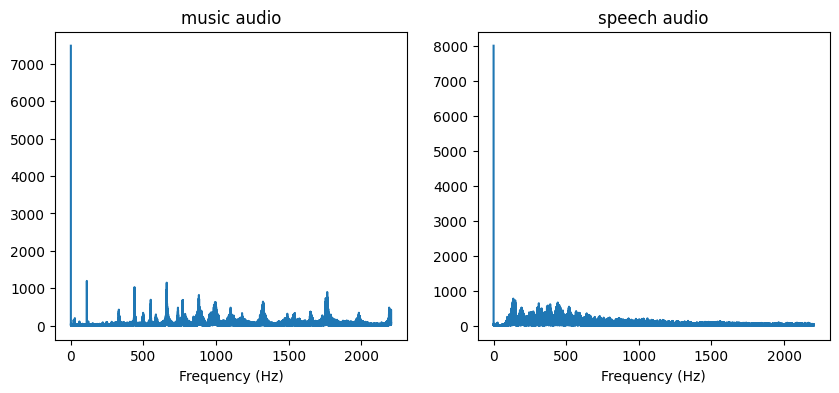

sample index: 24


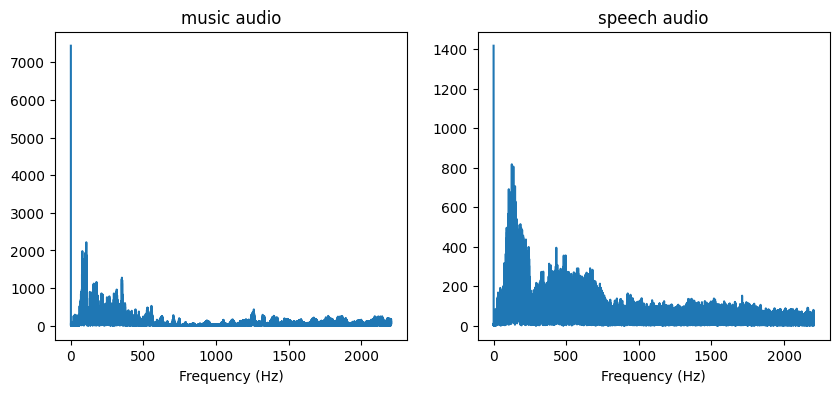

sample index: 40


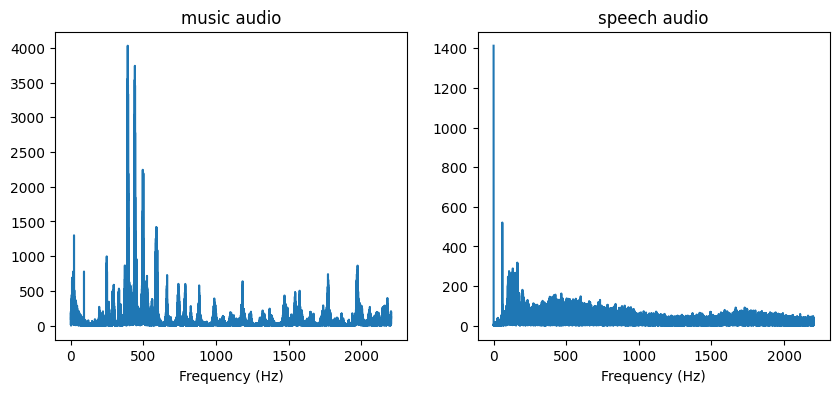

In [8]:
def plot_magnitude_spectrum(music_signal, speech_signal, sr, f_ratio=1):
    X_m = np.fft.fft(music_signal)
    X_mag_m = np.absolute(X_m)
    
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
    
    f_m = np.linspace(0, sr, len(X_mag_m))
    f_bins_m = int(len(X_mag_m)*f_ratio)  
    
    axes[0].plot(f_m[:f_bins_m], X_mag_m[:f_bins_m])
    axes[0].set_xlabel('Frequency (Hz)')
    axes[0].set_title('music audio')
    
    X_s = np.fft.fft(speech_signal)
    X_mag_s = np.absolute(X_s)
    
    
    f_s = np.linspace(0, sr, len(X_mag_s))
    f_bins_s = int(len(X_mag_s)*f_ratio)  
    
    axes[1].plot(f_s[:f_bins_s], X_mag_s[:f_bins_s])
    axes[1].set_xlabel('Frequency (Hz)')
    axes[1].set_title('speech audio')
    plt.show()

for sample in range(4):
    random_sampleidx = np.random.randint(0, 65)
    print(f'sample index: {random_sampleidx}')
    plot_magnitude_spectrum(music_vectors[random_sampleidx,:],speech_vectors[random_sampleidx,:], sampling_rate, 0.1)


sample index: 11


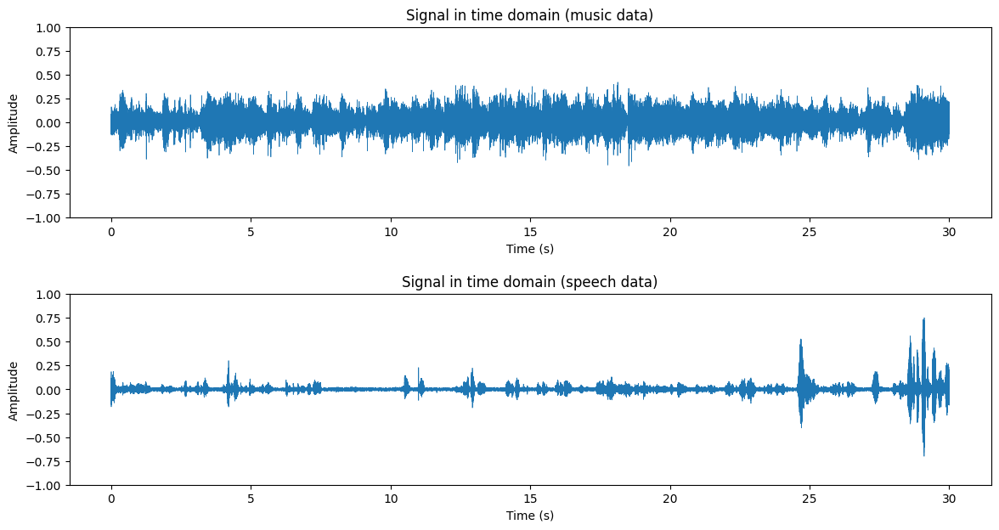

sample index: 52


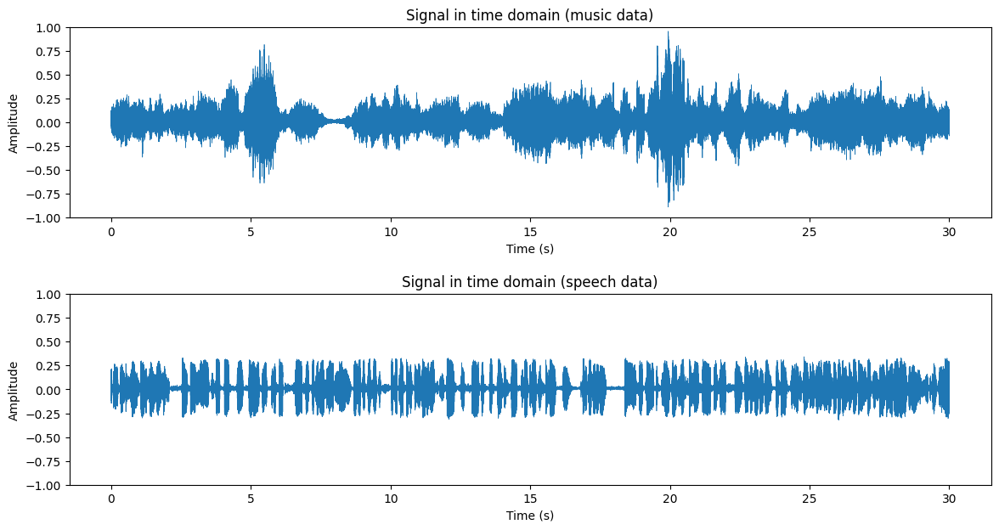

In [9]:
def wave_plot(music_signal, speech_signal, sr):

    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 7))
    
    plt.subplots_adjust(hspace=0.4)

    time_music = np.arange(0, len(music_signal)) / sr
    axes[0].plot(time_music, music_signal, linewidth=0.5)
    axes[0].set_title('Signal in time domain (music data)')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Amplitude')
    

    axes[0].set_ylim(-1, 1)

    time_speech = np.arange(0, len(speech_signal)) / sr
    axes[1].plot(time_speech, speech_signal, linewidth=0.5)
    axes[1].set_title('Signal in time domain (speech data)')
    axes[1].set_xlabel('Time (s)')
    axes[1].set_ylabel('Amplitude')
    

    axes[1].set_ylim(-1, 1)

    plt.show()

for sample in range(2):
    random_sampleidx = np.random.randint(0, 65)
    print(f'sample index: {random_sampleidx}')
    wave_plot(music_vectors[random_sampleidx,:],speech_vectors[random_sampleidx,:], sampling_rate)


sample index: 29
(1025, 1292)


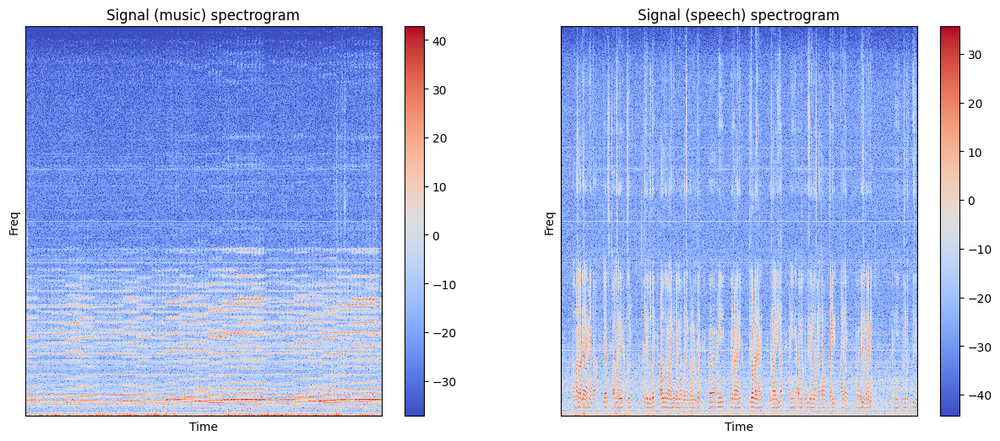

sample index: 33
(1025, 1292)


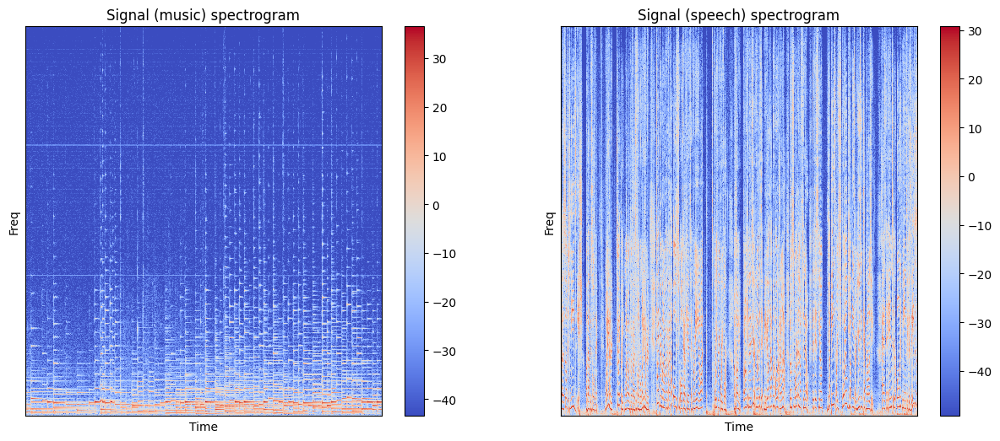

sample index: 17
(1025, 1292)


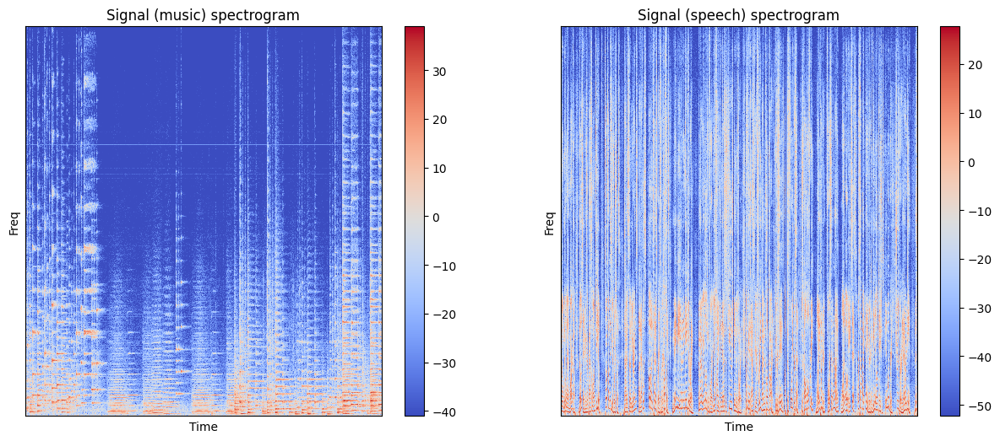

In [8]:
n_fft = 255       # number of FFT points (it determines the frequency resolution of the spectrogram)
hop_length = 128  # it is the number of samples between consecutive frames in the spectrogram

def spectrogram_plot(music_signal, speech_signal, n_fft, hop_length):

    spectrogram_m = np.abs(librosa.core.stft(music_signal, n_fft=n_fft, hop_length=hop_length))
    spectrogram_s = np.abs(librosa.core.stft(speech_signal, n_fft=n_fft, hop_length=hop_length))
    print(spectrogram_m.shape)
    plt.figure(figsize=(15, 6))
    
    plt.subplot(1, 2, 1)
    librosa.display.specshow(librosa.amplitude_to_db(spectrogram_m))
    plt.title('Signal (music) spectrogram')
    plt.xlabel('Time')
    plt.ylabel('Freq')
    plt.colorbar()

    plt.subplot(1, 2, 2)
    librosa.display.specshow(librosa.amplitude_to_db(spectrogram_s))
    plt.title('Signal (speech) spectrogram')
    plt.xlabel('Time')
    plt.ylabel('Freq')
    plt.colorbar()

    plt.show()


for sample in range(3):
    random_sampleidx = np.random.randint(0, 65)
    print(f'sample index: {random_sampleidx}')
    
    spectrogram_plot(music_vectors[random_sampleidx, :], speech_vectors[random_sampleidx, :], n_fft=2048, hop_length=512)

    

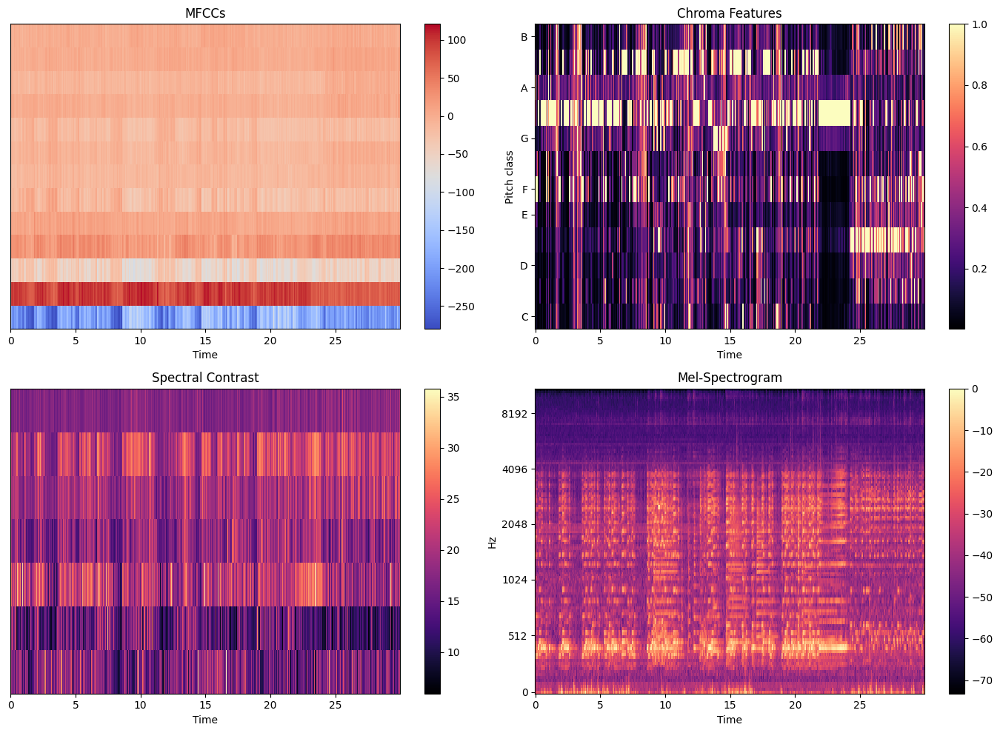

In [9]:
sample = music_vectors[5,:]
sr = sampling_rate

def visualize_spectrogtams(sample, sr):
    # MFCCs with Librosa
    mfccs = librosa.feature.mfcc(y=sample, sr=sr, n_mfcc=13)

    # Chroma Features with Librosa
    chroma = librosa.feature.chroma_stft(y=sample, sr=sr)

    # Spectral Contrast with Librosa
    spectral_contrast = librosa.feature.spectral_contrast(y=sample, sr=sr)

    # Mel-Spectrogram with Librosa
    mel_spectrogram = librosa.feature.melspectrogram(y=sample, sr=sr)

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    im = librosa.display.specshow(mfccs, x_axis='time', ax=axes[0, 0])
    axes[0, 0].set_title('MFCCs')
    fig.colorbar(im, ax=axes[0, 0])
    
    im = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=axes[0, 1])
    axes[0, 1].set_title('Chroma Features')
    fig.colorbar(im, ax=axes[0, 1])

    im = librosa.display.specshow(spectral_contrast, x_axis='time', ax=axes[1, 0])
    axes[1, 0].set_title('Spectral Contrast')
    fig.colorbar(im, ax=axes[1, 0])

    im = librosa.display.specshow(librosa.power_to_db(mel_spectrogram, ref=np.max), y_axis='mel', x_axis='time', ax=axes[1, 1])
    axes[1, 1].set_title('Mel-Spectrogram')
    fig.colorbar(im, ax=axes[1, 1])

    plt.tight_layout()
    plt.show()

visualize_spectrogtams(sample, sr)


### Which one to choose? ###
- for classifiaction problems (our problem) MFCCs are good,
- computationally less expensive are Chroma Features and Spectral Contrast in comparison to MFCCs,
- Spectral Contrast features can be robust to variations in background noise (we can check it),

But still, if we focus on the main task - classification - the MFCCs are the best.


In [10]:
def get_spectrogram(music_samples, speech_samples, sr):
    data_music = []
    for singe_sample in music_samples:
        mfcc = librosa.feature.mfcc(y=singe_sample,sr=sr)
        data_music.append(mfcc)
        
    data_music = np.array(data_music)
    
    data_speech = []
    for singe_sample in speech_samples:
        mfcc = librosa.feature.mfcc(y=singe_sample,sr=sr)
        data_speech.append(mfcc)
        
    data_speech = np.array(data_speech)
    
    labels_music = np.ones(len(data_music))
    labels_speech = np.zeros(len(data_speech))

    dataset = np.concatenate((data_music,data_speech))
    labels = np.concatenate((labels_music,labels_speech))
    
    return dataset, labels

dataset, labels = get_spectrogram(music_vectors,speech_vectors,sr)


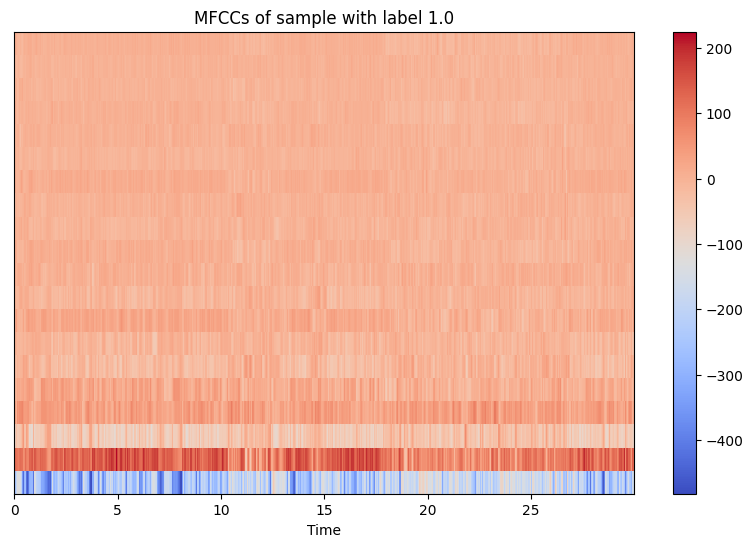

In [11]:
test_size=0.2
random_state=42

X_train, X_test, y_train, y_test = train_test_split(dataset, labels, test_size=test_size, random_state=random_state)

# visualizing single sample from training set:
plt.figure(figsize=(10,6))
librosa.display.specshow(X_train[9,:,:], x_axis='time')
plt.title(f'MFCCs of sample with label {labels[9]}')
plt.colorbar()
plt.show()


In [12]:
print(f'For now my single sample will have shape: {X_train[0,:,:].shape}\nBut if i want to use CNNs Im gonna need (n, m, 1) - just like for gray image')

X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1)
# let's see:
print(f'Current shape: {X_train[0,:,:,:].shape}')


For now my single sample will have shape: (20, 1292)
But if i want to use CNNs Im gonna need (n, m, 1) - just like for gray image
Current shape: (20, 1292, 1)


### Let's build a simple model ###
and train it with the use of original samples

In [13]:
def simple_CNN_model(input_shape):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Flatten())
    # model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    return model

input_shape = (X_train.shape[1],X_train.shape[2],X_train.shape[3])
model = simple_CNN_model(input_shape)



Epoch 1/10


26/26 [==============================] - 2s 39ms/step - loss: 2.1583 - accuracy: 0.6961 - val_loss: 0.2760 - val_accuracy: 0.9231
Epoch 2/10
26/26 [==============================] - 1s 30ms/step - loss: 0.4513 - accuracy: 0.8333 - val_loss: 0.3638 - val_accuracy: 0.8077
Epoch 3/10
26/26 [==============================] - 1s 30ms/step - loss: 0.4742 - accuracy: 0.8627 - val_loss: 0.4318 - val_accuracy: 0.8462
Epoch 4/10
26/26 [==============================] - 1s 30ms/step - loss: 0.1738 - accuracy: 0.9510 - val_loss: 0.4219 - val_accuracy: 0.7308
Epoch 5/10
26/26 [==============================] - 1s 30ms/step - loss: 0.1373 - accuracy: 0.9412 - val_loss: 0.3521 - val_accuracy: 0.7692
Epoch 6/10
26/26 [==============================] - 1s 30ms/step - loss: 0.1163 - accuracy: 0.9804 - val_loss: 0.1615 - val_accuracy: 0.9231
Epoch 7/10
26/26 [==============================] - 1s 30ms/step - loss: 0.0367 - accuracy: 0.9902 - val_loss: 0.1052 - val_accuracy: 0.9615
Epoch 8/10

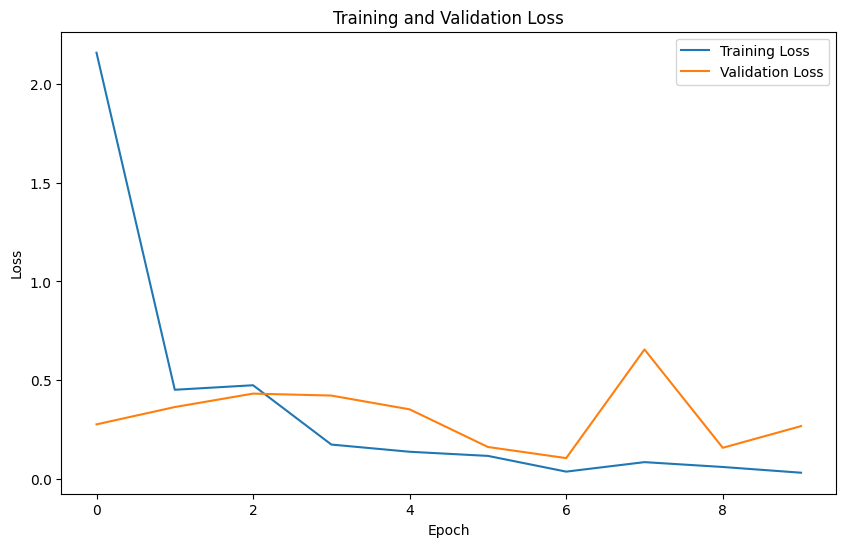

1/1 [==============================] - 0s 137ms/step
Accuracy: 0.9230769230769231
Classification Report:
               precision    recall  f1-score   support

         0.0       0.92      0.92      0.92        13
         1.0       0.92      0.92      0.92        13

    accuracy                           0.92        26
   macro avg       0.92      0.92      0.92        26
weighted avg       0.92      0.92      0.92        26



In [14]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history = model.fit(X_train, y_train, epochs=10, batch_size=4, validation_data=(X_test, y_test))

plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

y_pred = (model.predict(X_test) > 0.5).astype("int32")
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

It' seems to be good.

### Let's try with GAN model now ###
But mostly for generating new data - noised data. Due to a fact we do not have enough time, resources and amount of data, building a GAN model for generating new audio (spectrograms) is just not possible.



In [15]:
def build_generator(latent_dim, img_shape):

    model = Sequential()
    model.add(Dense(256, input_dim=latent_dim)) 
    model.add(LeakyReLU(alpha=0.2)) 
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(Dense(512)) 
    model.add(LeakyReLU(alpha=0.2))
    model.add(BatchNormalization(momentum=0.8)) 
    model.add(Dense(1024)) 
    model.add(LeakyReLU(alpha=0.2)) 
    model.add(BatchNormalization(momentum=0.8))
    model.add(Dense(np.prod(img_shape), activation='tanh'))
    model.add(Reshape(img_shape))

    noise = Input(shape=(latent_dim,))
    img = model(noise)

    return Model(noise, img)

In [16]:
def build_discriminator(img_shape):

    model = Sequential()

    model.add(Flatten(input_shape=img_shape))
    model.add(Dense(512)) 
    model.add(LeakyReLU(alpha=0.2)) 
    model.add(Dense(256)) 
    model.add(LeakyReLU(alpha=0.2)) 
    model.add(Dense(1, activation='sigmoid'))

    img = Input(shape=img_shape)
    validity = model(img)

    return Model(img, validity)

In [17]:
input_shape = (X_train.shape[1],X_train.shape[2],X_train.shape[3])
latent_dim = 100

discriminator = build_discriminator(input_shape)
optimizer = tf.keras.optimizers.legacy.Adam(0.0002, 0.5)

discriminator.compile(loss='binary_crossentropy',
                      optimizer=optimizer,
                      metrics=['accuracy'])

generator = build_generator(latent_dim, input_shape)

z = Input(shape=(latent_dim,))
img = generator(z)

discriminator.trainable = False

validity = discriminator(img)

GAN = Model(z, validity)

GAN.compile(loss='binary_crossentropy', optimizer=optimizer)

In [18]:
def show_generated_spectrograms(epoch, latent_dim, generator, sr=22050, hop_length=128):
    r, c = 5, 5
    noise = np.random.normal(0, 1, (r * c, latent_dim))
    gen_spectrograms = generator.predict(noise)

    fig, axs = plt.subplots(r, c, figsize=(15, 15))
    fig.suptitle('\nSpectrograms generated after epoch {}'.format(epoch))
    cnt = 0
    for i in range(r):
        for j in range(c):
            ax = axs[i, j]
            
            librosa.display.specshow(np.abs(gen_spectrograms[cnt, :, :, 0]), sr=sr, hop_length=hop_length, ax=ax)
            
            ax.axis('off')
            cnt += 1


1/1 [==============================] - 0s 160ms/step
Epoch 1/3000: - Discriminator_loss: 2.690138, - Discriminator_accuracy: 43.75% - Generator_loss: 0.675699
1/1 [==============================] - 0s 35ms/step
Epoch 2/3000: - Discriminator_loss: 0.350702, - Discriminator_accuracy: 68.75% - Generator_loss: 0.638909
1/1 [==============================] - 0s 37ms/step
Epoch 3/3000: - Discriminator_loss: 0.381476, - Discriminator_accuracy: 62.50% - Generator_loss: 0.601130
1/1 [==============================] - 0s 34ms/step
Epoch 4/3000: - Discriminator_loss: 0.418432, - Discriminator_accuracy: 56.25% - Generator_loss: 0.473202
1/1 [==============================] - 0s 36ms/step
Epoch 5/3000: - Discriminator_loss: 0.427973, - Discriminator_accuracy: 62.50% - Generator_loss: 0.426145
1/1 [==============================] - 0s 36ms/step
Epoch 6/3000: - Discriminator_loss: 0.430901, - Discriminator_accuracy: 87.50% - Generator_loss: 0.388343
1/1 [==============================] - 0s 37ms/step

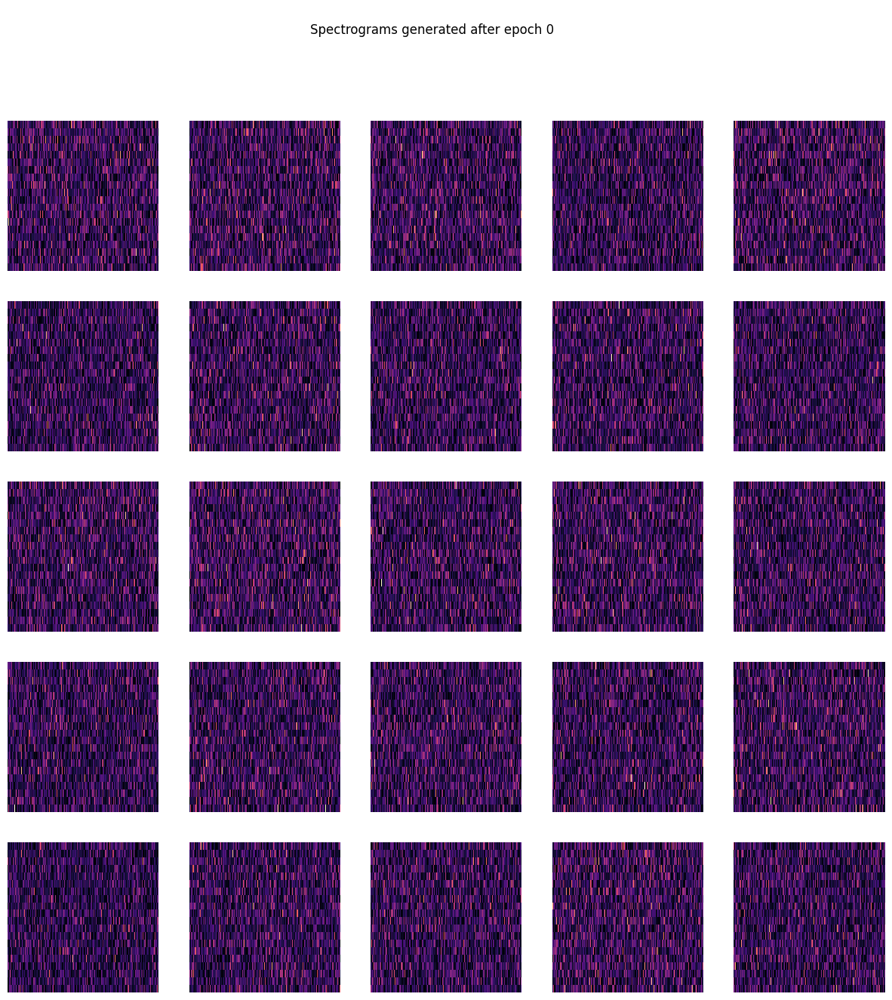

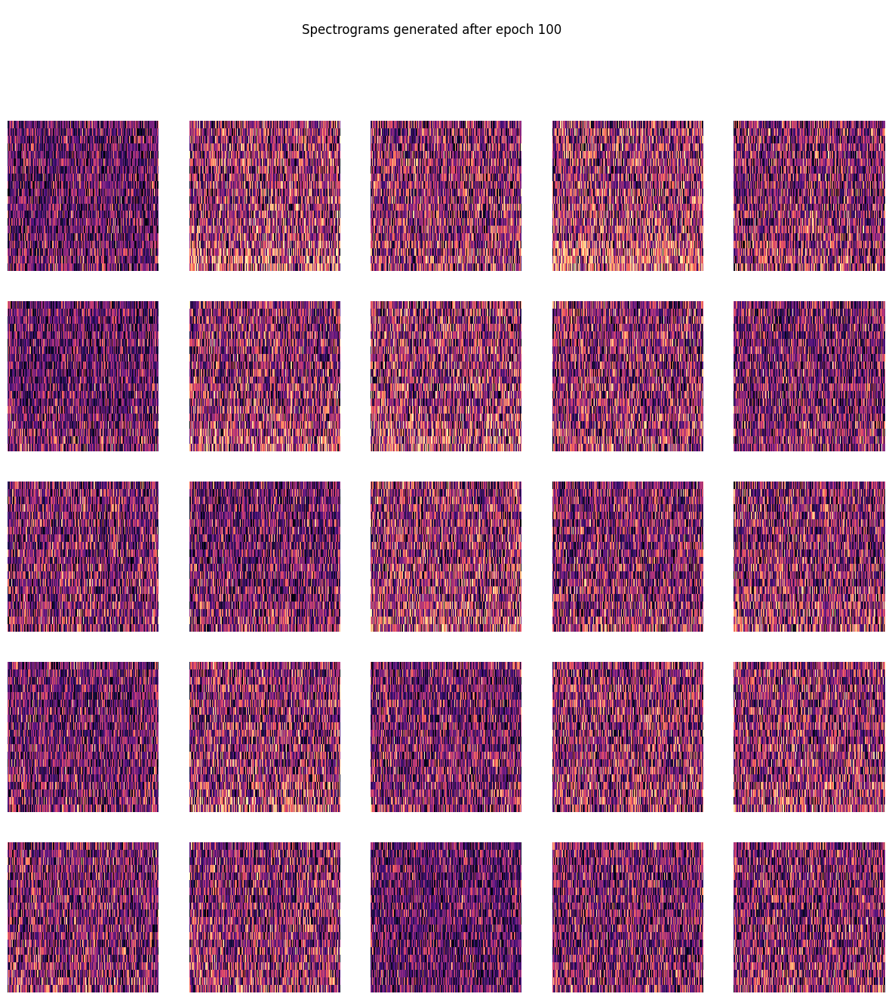

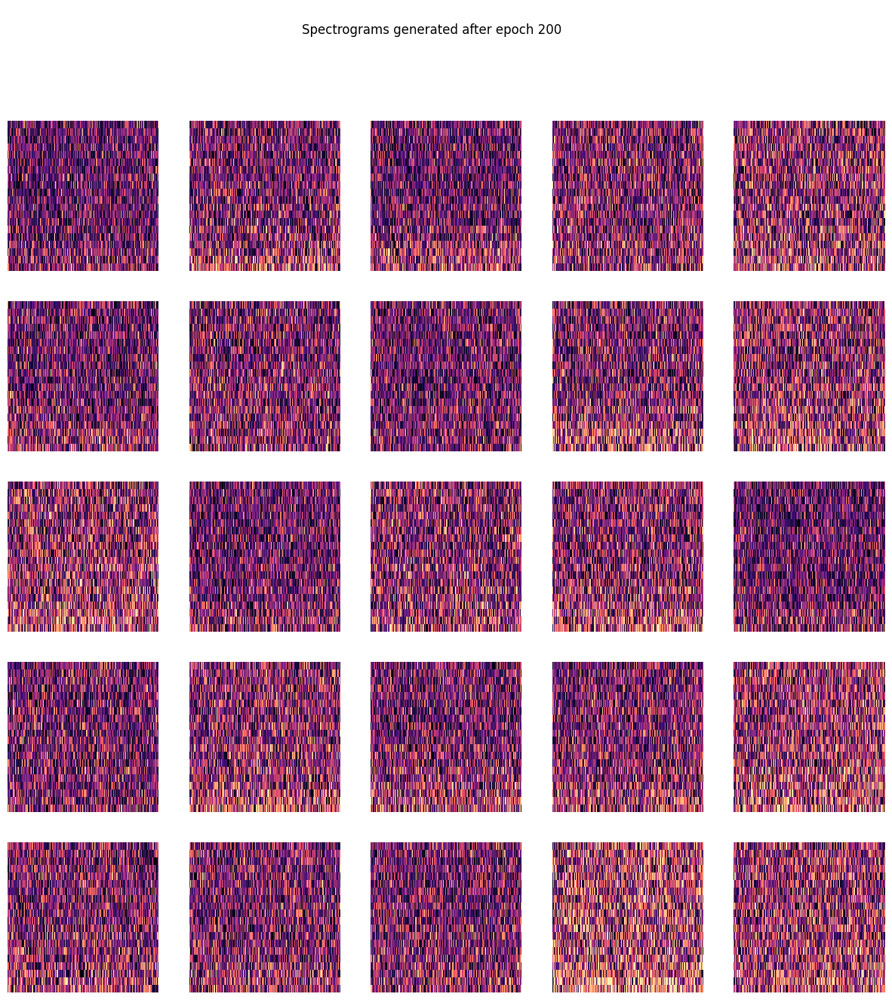

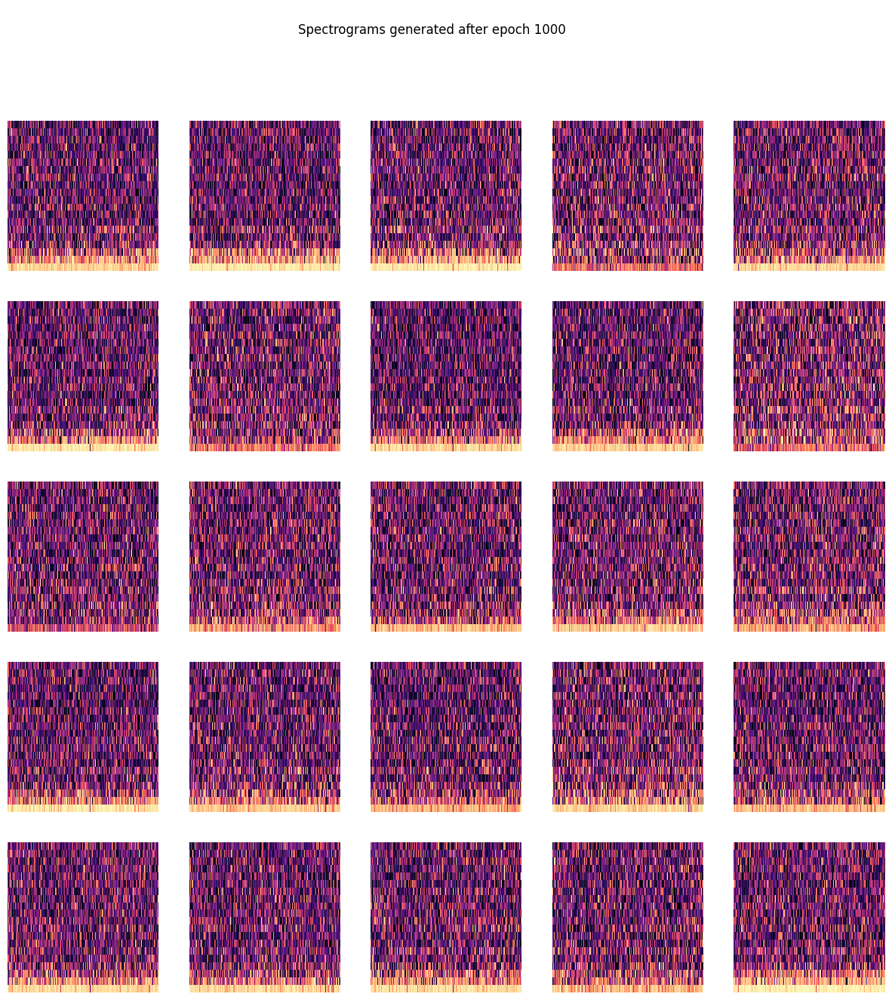

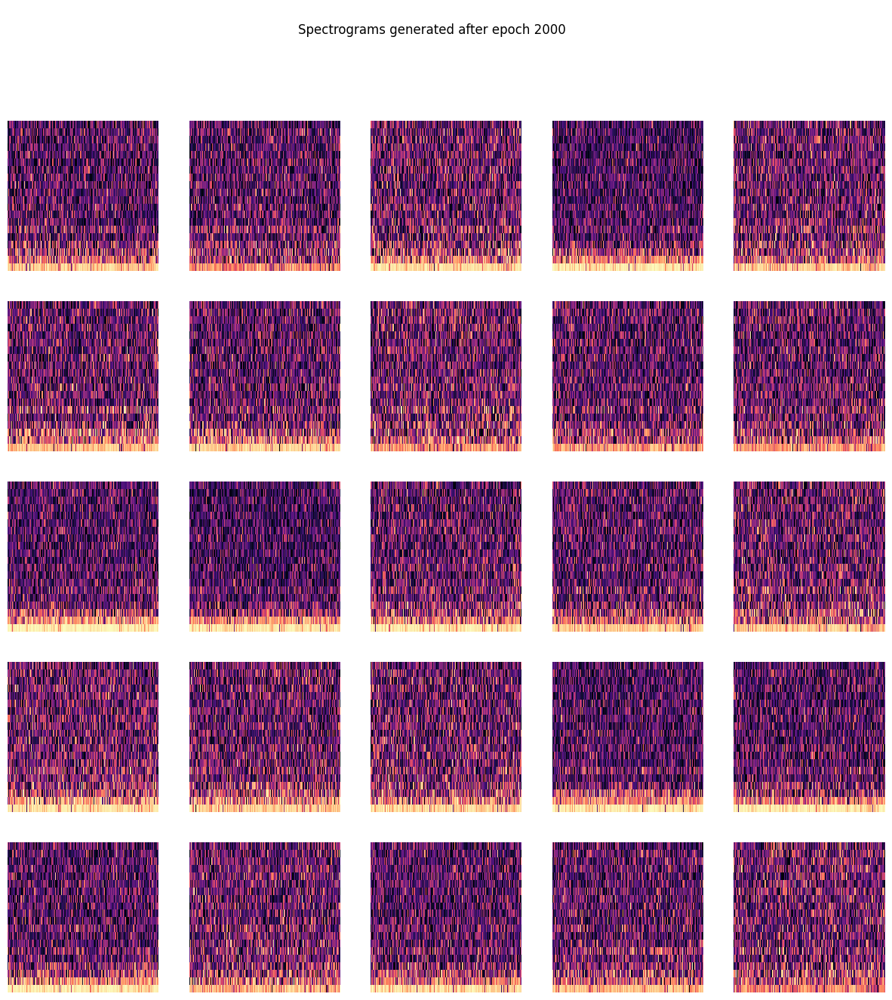

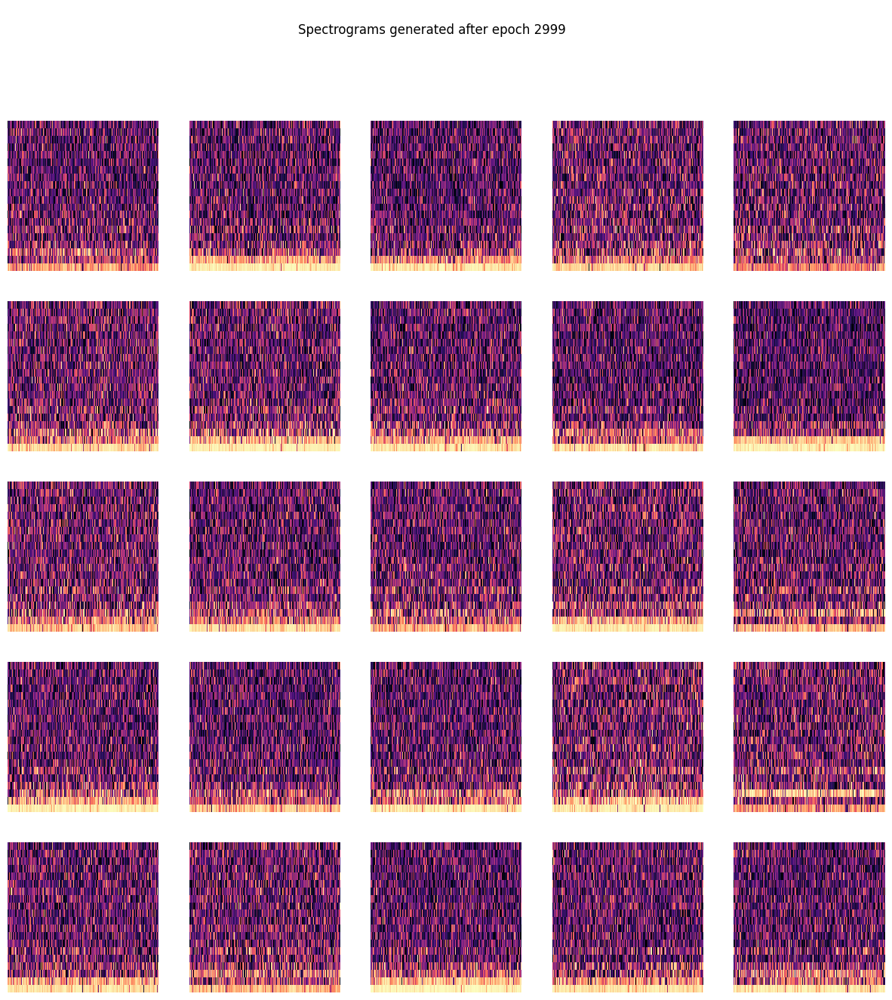

In [19]:
epochs = 3000
batch_size = 8

y_true = np.ones((batch_size,1)) # for real spectrograms the label will be 1
y_fake = np.zeros((batch_size,1)) # for fake spectrograms the label will be 0


for epoch in range(epochs):

    idx = np.random.randint(0, X_train.shape[0], batch_size)
    x_train_batch = X_train[idx]

    noise = np.random.normal(0,1,(batch_size,latent_dim))
    generated_spectrograms = generator.predict(noise)

    discriminator_loss_real = discriminator.train_on_batch(x_train_batch, y_true)
    discriminator_loss_fake = discriminator.train_on_batch(generated_spectrograms, y_fake)
    discriminator_loss = 0.5 * np.add(discriminator_loss_real, discriminator_loss_fake)
    
    noise = np.random.normal(0, 1, (batch_size, latent_dim))
    generator_loss = GAN.train_on_batch(noise, y_true)
    
    print("Epoch %d/%d: - Discriminator_loss: %f, - Discriminator_accuracy: %.2f%% - Generator_loss: %f" %
          (epoch+1, epochs, discriminator_loss[0], 100*discriminator_loss[1], generator_loss))
    
    if epoch in [0, 100, 200, 1000, 2000, epochs-1]:
        show_generated_spectrograms(epoch, latent_dim, generator)
    
    

Just an overview of generated spectrograms:

1/1 [==============================] - 0s 35ms/step


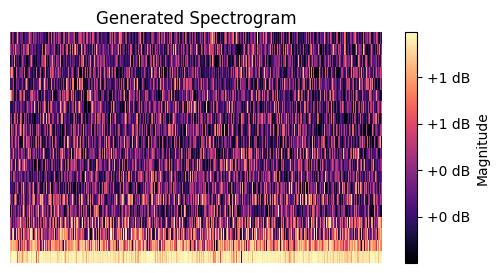

1/1 [==============================] - 0s 71ms/step
Discriminator Result: 0.35808226


In [20]:
single_noise = np.random.normal(0, 1, (1, latent_dim))
generated_spectrogram = generator.predict(single_noise)

fig, ax = plt.subplots(figsize=(6, 3))
img = librosa.display.specshow(np.abs(generated_spectrogram[0, :, :, 0]), ax=ax)

cbar = plt.colorbar(img, ax=ax, format="%+2.0f dB")  
cbar.set_label('Magnitude')

ax.set_title('Generated Spectrogram')
ax.axis('off')
plt.show()

generated_spectrogram = np.reshape(generated_spectrogram, (1,) + input_shape)

[[discriminator_result]] = discriminator.predict(generated_spectrogram)

print("Discriminator Result:", discriminator_result)


1/1 [==============================] - 0s 32ms/step


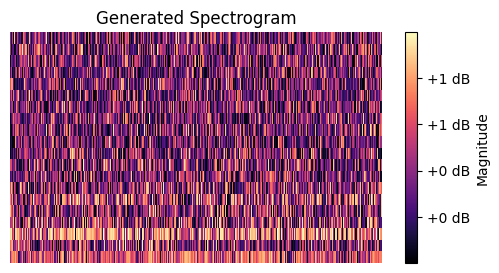

(20, 1292, 1)


In [21]:
single_noise = np.random.normal(0, 1, (1, latent_dim))
generated_spectrogram = generator.predict(single_noise)
generated_spectrogram = np.reshape(generated_spectrogram, (1,) + input_shape)

fig, ax = plt.subplots(figsize=(6, 3))
img = librosa.display.specshow(np.abs(generated_spectrogram[0, :, :, 0]), ax=ax)
cbar = plt.colorbar(img, ax=ax, format="%+2.0f dB")
cbar.set_label('Magnitude')
ax.set_title('Generated Spectrogram')
ax.axis('off')
plt.show()

print(generated_spectrogram[0,:,:,:].shape)

In [22]:
def evaluation_of_GAN(n, test_set, generator, discriminator, threshold=0.5, latent_dim=100, input_shape=None):

    real_correct_count = 0
    real_incorrect_count = 0
    generated_correct_count = 0
    generated_incorrect_count = 0

    for i in range(len(test_set)):
        single_sample = test_set[i, :, :, :]
        single_sample = np.reshape(single_sample, (1,) + input_shape)

        [[discriminator_result]] = discriminator.predict(single_sample)

        if discriminator_result >= threshold:
            real_correct_count += 1
        else:
            real_incorrect_count += 1

    for _ in range(n):
        single_noise = np.random.normal(0, 1, (1, latent_dim))
        generated_spectrogram = generator.predict(single_noise)

        generated_spectrogram = np.reshape(generated_spectrogram, (1,) + input_shape)

        [[discriminator_result]] = discriminator.predict(generated_spectrogram)

        if discriminator_result < threshold:
            generated_correct_count += 1
        else:
            generated_incorrect_count += 1

    print(f'Real Correctly Classified Samples: {real_correct_count}')
    print(f'Real Incorrectly Classified Samples: {real_incorrect_count}')
    print(f'Generated Correctly Classified Samples: {generated_correct_count}')
    print(f'Generated Incorrectly Classified Samples: {generated_incorrect_count}')

evaluation_of_GAN(int(len(X_test[:,0,0,0])), X_test, generator, discriminator, input_shape=input_shape)

1/1 [==============================] - 0s 25ms/step
Real Correctly Classified Samples: 26
Real Incorrectly Classified Samples: 0
Generated Correctly Classified Samples: 26
Generated Incorrectly Classified Samples: 0


***Training GAN models only on music data or speech data***
1. Let's see the quality of generated data if we reduce the diversity of our training set (but yes, we are aware of reducing the amount of data with this operation).
2. Let's use the GAN model as a form of augmentation - to increase the size of our training set.

In [23]:
def get_specific_spectrogram(samples, label, sr):
    data = []
    for singe_sample in samples:
        mfcc = librosa.feature.mfcc(y=singe_sample,sr=sr)
        data.append(mfcc)
        
    data = np.array(data)
    
    if label == 'music':
        labels = np.ones(len(data))
        
    elif label == 'speech':
        labels = np.zeros(len(data))

    
    return data, labels

First MUSIC AUDIO

In [24]:
# as before:
dataset_music, labels_music = get_specific_spectrogram(music_vectors,'music',sr)

test_size=0.2
random_state=42

X_train_m, X_test_m, y_train_m, y_test_m = train_test_split(dataset_music, labels_music, test_size=test_size, random_state=random_state)

X_train_m = X_train_m.reshape(X_train_m.shape[0], X_train_m.shape[1], X_train_m.shape[2], 1)
X_test_m = X_test_m.reshape(X_test_m.shape[0], X_test_m.shape[1], X_test_m.shape[2], 1)


Now GAN model for music data:

In [25]:
input_shape_m = (X_train_m.shape[1],X_train_m.shape[2],X_train_m.shape[3])
latent_dim = 100

discriminator_m = build_discriminator(input_shape_m)
optimizer = tf.keras.optimizers.legacy.Adam(0.0002, 0.5)

discriminator_m.compile(loss='binary_crossentropy',
                        optimizer=optimizer,
                        metrics=['accuracy'])

generator_m = build_generator(latent_dim, input_shape_m)

z = Input(shape=(latent_dim,))
img = generator_m(z)

discriminator_m.trainable = False

validity_m = discriminator_m(img)

GAN_music = Model(z, validity_m)

GAN_music.compile(loss='binary_crossentropy', optimizer=optimizer)

1/1 [==============================] - 0s 168ms/step
Epoch 1/3000: - Discriminator_loss: 0.342988, - Discriminator_accuracy: 75.00% - Generator_loss: 0.711925
1/1 [==============================] - 0s 37ms/step
Epoch 2/3000: - Discriminator_loss: 0.127322, - Discriminator_accuracy: 100.00% - Generator_loss: 0.776817
1/1 [==============================] - 0s 43ms/step
Epoch 3/3000: - Discriminator_loss: 0.156368, - Discriminator_accuracy: 100.00% - Generator_loss: 1.028271
1/1 [==============================] - 0s 43ms/step
Epoch 4/3000: - Discriminator_loss: 0.372531, - Discriminator_accuracy: 75.00% - Generator_loss: 0.824879
1/1 [==============================] - 0s 36ms/step
Epoch 5/3000: - Discriminator_loss: 0.458023, - Discriminator_accuracy: 62.50% - Generator_loss: 2.009017
1/1 [==============================] - 0s 39ms/step
Epoch 6/3000: - Discriminator_loss: 0.376685, - Discriminator_accuracy: 81.25% - Generator_loss: 2.577678
1/1 [==============================] - 0s 37ms/st

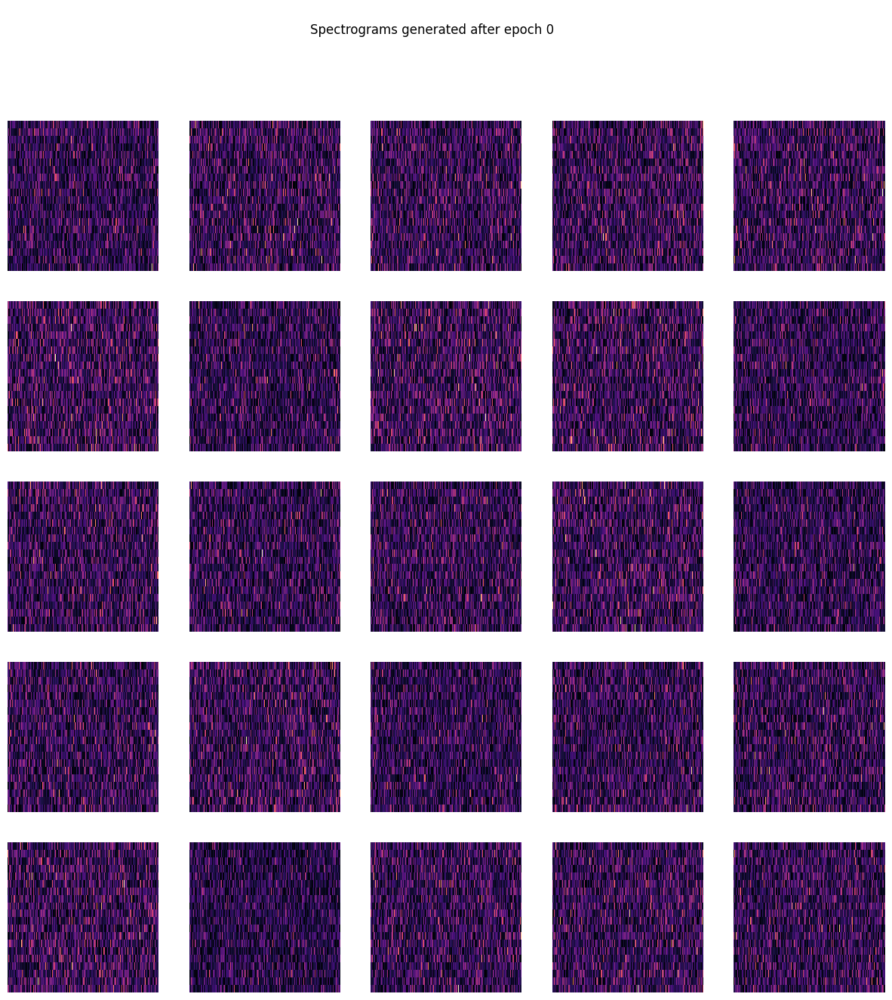

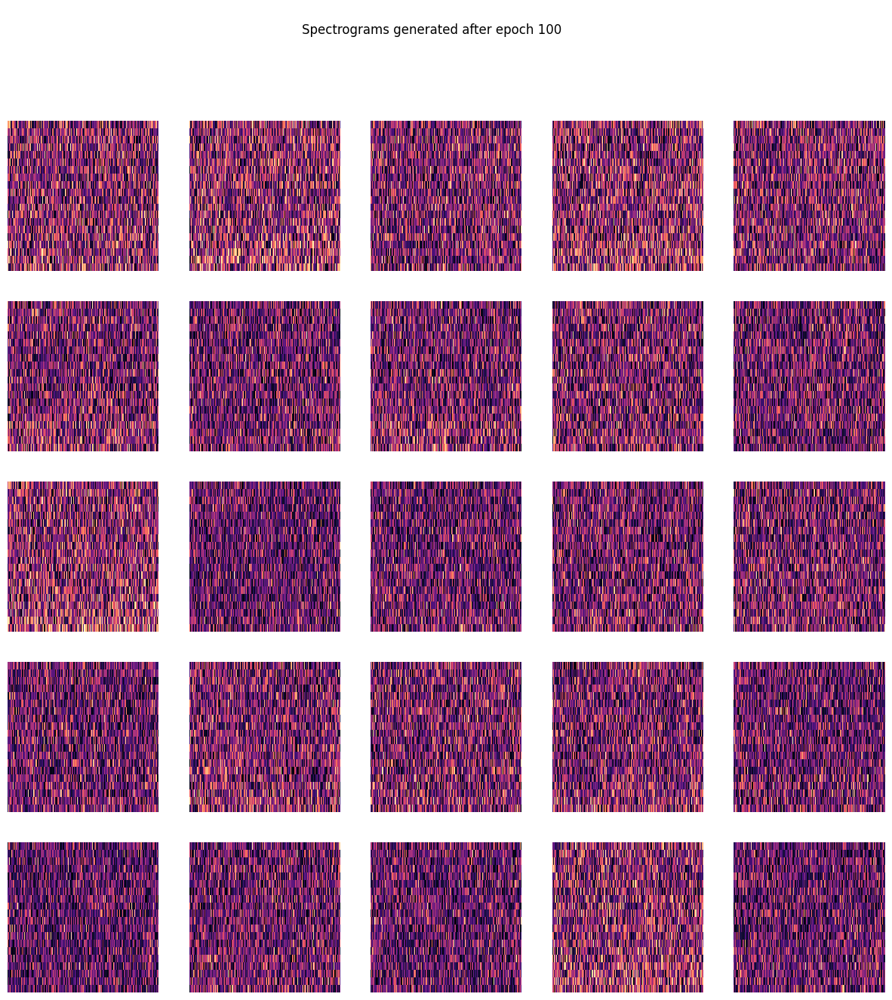

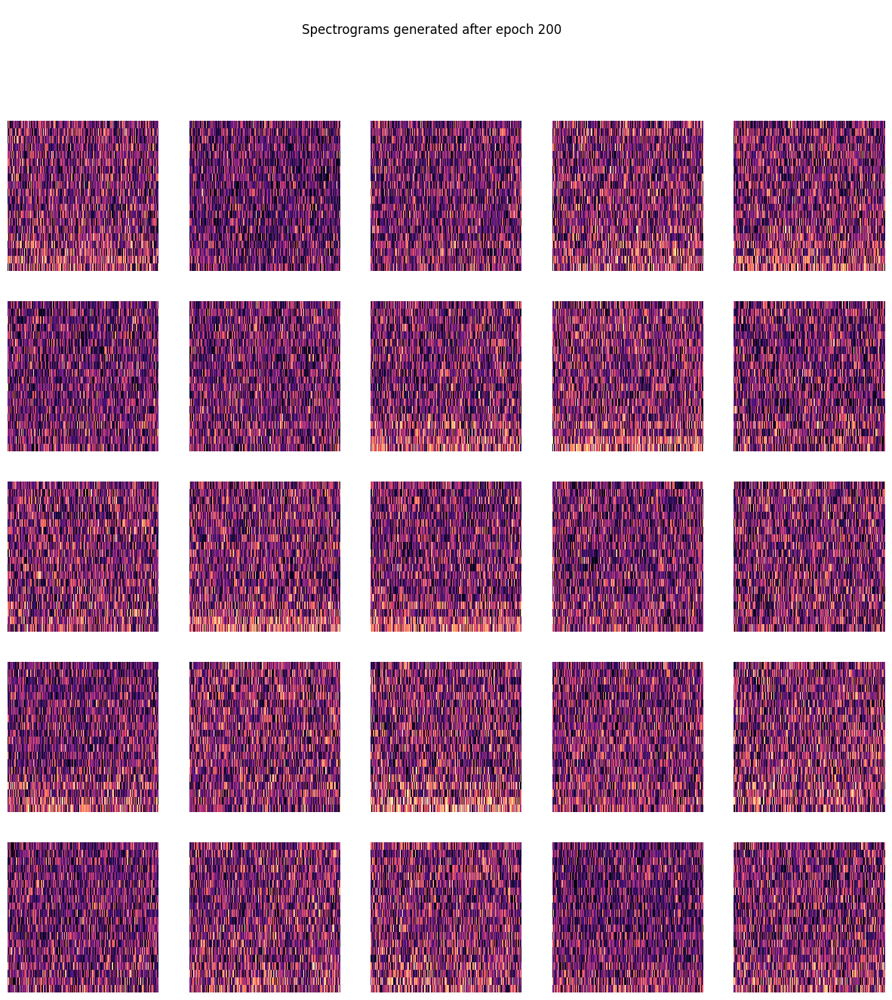

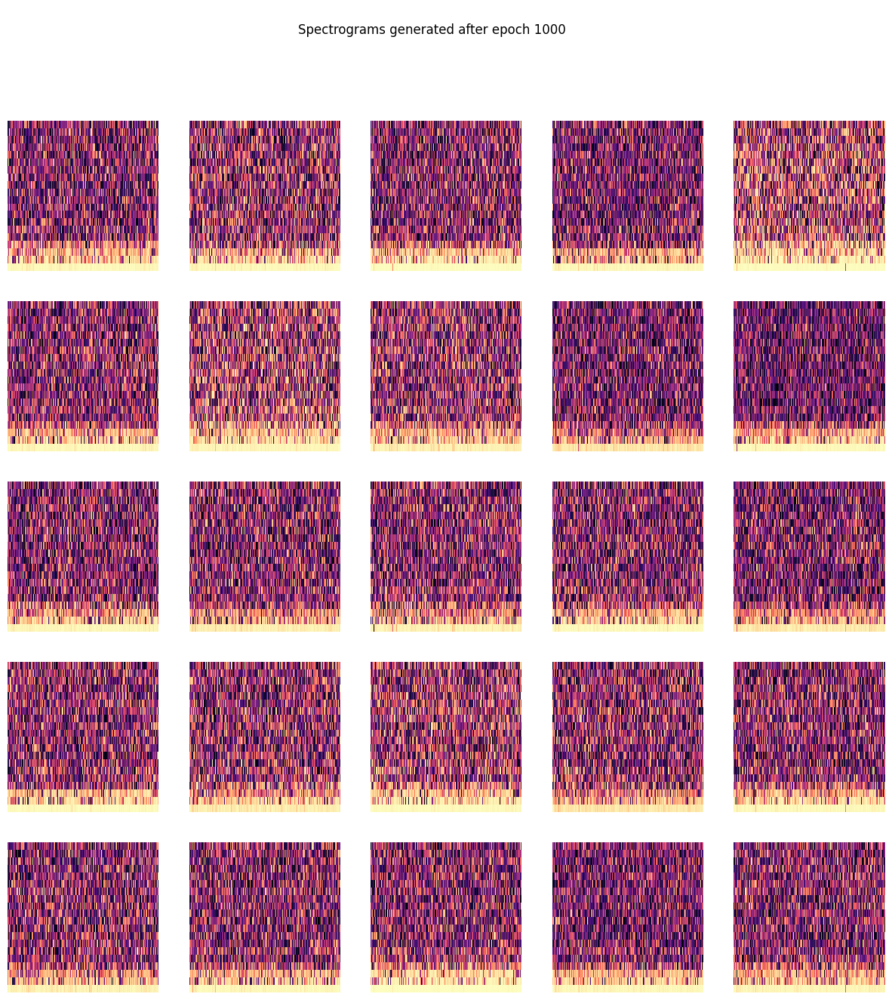

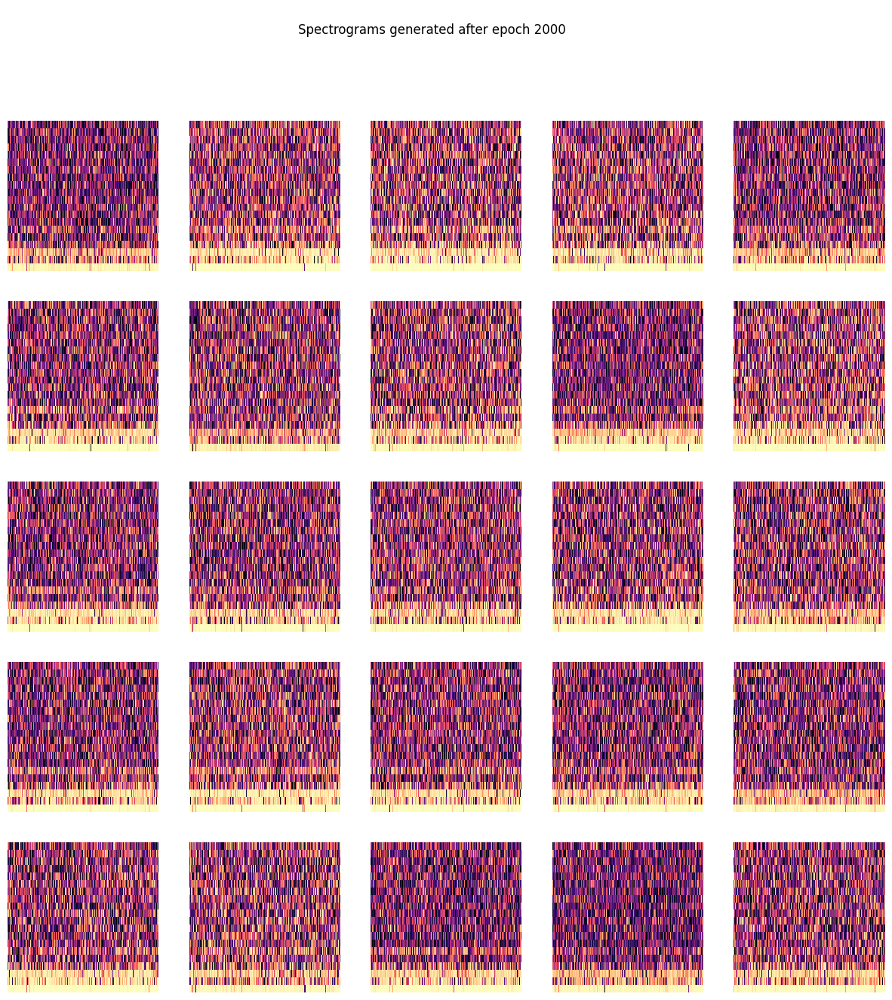

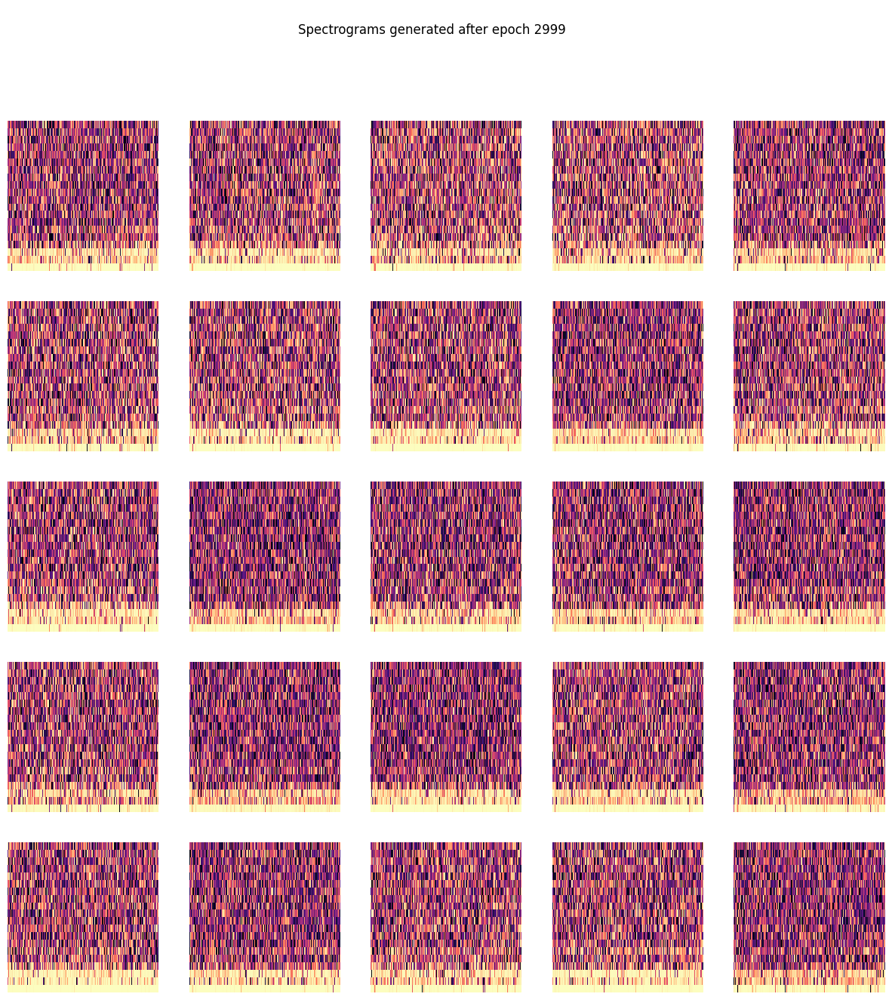

In [26]:
epochs = 3000
batch_size = 8

y_true = np.ones((batch_size,1))    # for real spectrograms the label will be 1
y_fake = np.zeros((batch_size,1))   # for fake spectrograms the label will be 0


for epoch in range(epochs):

    idx = np.random.randint(0, X_train_m.shape[0], batch_size)
    x_train_batch = X_train_m[idx]

    noise = np.random.normal(0,1,(batch_size,latent_dim))
    generated_spectrograms_m = generator_m.predict(noise)

    discriminator_loss_real = discriminator_m.train_on_batch(x_train_batch, y_true)
    discriminator_loss_fake = discriminator_m.train_on_batch(generated_spectrograms_m, y_fake)
    discriminator_loss = 0.5 * np.add(discriminator_loss_real, discriminator_loss_fake)
    
    noise = np.random.normal(0, 1, (batch_size, latent_dim))
    generator_loss = GAN_music.train_on_batch(noise, y_true)
    
    print("Epoch %d/%d: - Discriminator_loss: %f, - Discriminator_accuracy: %.2f%% - Generator_loss: %f" %
          (epoch+1, epochs, discriminator_loss[0], 100*discriminator_loss[1], generator_loss))
    
    if epoch in [0, 100, 200, 1000, 2000, epochs-1]:
        show_generated_spectrograms(epoch, latent_dim, generator_m)
    
    

if we have it, lets generate some new music data (and when we're already here, we can see how discriminator deals with it)

In [27]:
n = 64
latent_dim = 100
input_shape_m = (X_train_m.shape[1],X_train_m.shape[2],X_train_m.shape[3])

def generate_music_with_GAN(n: int, latent_dim, input_shape, discriminator_m, generator_m):
    
    new_generated_music = []
    count = 0
    for i in range(n):
        single_noise = np.random.normal(0,1, (1, latent_dim))
        
        generated_spectrogram = generator_m.predict(single_noise)
        generated_spectrogram = np.reshape(generated_spectrogram, (1,) + input_shape)

        
        [[discriminator_result]] = discriminator_m.predict(generated_spectrogram)
        if discriminator_result > 0.5:
            count += 1
        print(f'Generated music sound number {i}\n discriminator result: {discriminator_result}')
        
        new_generated_music.append(generated_spectrogram[0,:,:,:])
    
    print(f'Number of discriminator mistakes (it classified generated sound as real): {count}')
    
    new_generated_music = np.array(new_generated_music)

    return new_generated_music

new_generated_music = generate_music_with_GAN(n, latent_dim, input_shape_m, discriminator_m, generator_m)


1/1 [==============================] - 0s 98ms/step
Generated music sound number 0
 discriminator result: 6.662277930805918e-15
1/1 [==============================] - 0s 26ms/step
Generated music sound number 1
 discriminator result: 0.001404795446433127
1/1 [==============================] - 0s 27ms/step
Generated music sound number 2
 discriminator result: 0.3154730200767517
1/1 [==============================] - 0s 25ms/step
Generated music sound number 3
 discriminator result: 0.0003074248961638659
1/1 [==============================] - 0s 26ms/step
Generated music sound number 4
 discriminator result: 0.8958861827850342
1/1 [==============================] - 0s 24ms/step
Generated music sound number 5
 discriminator result: 0.0016279706032946706
1/1 [==============================] - 0s 26ms/step
Generated music sound number 6
 discriminator result: 6.246071393434249e-07
1/1 [==============================] - 0s 25ms/step
Generated music sound number 7
 discriminator result: 0.006

In [28]:
n = 64
input_shape_m = (X_train_m.shape[1],X_train_m.shape[2],X_train_m.shape[3])

def check_music_with_GAN(n: int, X_test_m, input_shape, discriminator_m):
    
    count = 0
    for i in range(len(X_test_m[:,0,0,0])):

        single_sample = X_test_m[0,:,:,:]
        single_sample = np.reshape(single_sample,(1,)+input_shape)
               
        [[discriminator_result]] = discriminator_m.predict(single_sample)
        if discriminator_result < 0.5:
            count += 1
        print(f'Music sound number {i}\n discriminator result: {discriminator_result}')
        
    
    print(f'Number of discriminator mistakes (it classified real sound as generated): {count}')
    
check_music_with_GAN(n, X_test_m,input_shape_m,discriminator_m)

1/1 [==============================] - 0s 29ms/step
Music sound number 0
 discriminator result: 1.0
1/1 [==============================] - 0s 26ms/step
Music sound number 1
 discriminator result: 1.0
1/1 [==============================] - 0s 26ms/step
Music sound number 2
 discriminator result: 1.0
1/1 [==============================] - 0s 25ms/step
Music sound number 3
 discriminator result: 1.0
1/1 [==============================] - 0s 28ms/step
Music sound number 4
 discriminator result: 1.0
1/1 [==============================] - 0s 25ms/step
Music sound number 5
 discriminator result: 1.0
1/1 [==============================] - 0s 25ms/step
Music sound number 6
 discriminator result: 1.0
1/1 [==============================] - 0s 26ms/step
Music sound number 7
 discriminator result: 1.0
1/1 [==============================] - 0s 26ms/step
Music sound number 8
 discriminator result: 1.0
1/1 [==============================] - 0s 25ms/step
Music sound number 9
 discriminator result: 1.0


In [29]:
evaluation_of_GAN(int(len(X_test_m[:,0,0,0])), X_test_m, generator_m, discriminator_m, input_shape=input_shape_m)


1/1 [==============================] - 0s 26ms/step
Real Correctly Classified Samples: 13
Real Incorrectly Classified Samples: 0
Generated Correctly Classified Samples: 12
Generated Incorrectly Classified Samples: 1


Well, it still does not generate sounds which discriminator would classified as real.

Then SPEECH AUDIO:

In [30]:
# as before:
dataset_speech, labels_speech = get_specific_spectrogram(speech_vectors,'speech',sr)

test_size=0.2
random_state=42

X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(dataset_speech, labels_speech, test_size=test_size, random_state=random_state)

X_train_s = X_train_s.reshape(X_train_s.shape[0], X_train_s.shape[1], X_train_s.shape[2], 1)
X_test_s = X_test_s.reshape(X_test_s.shape[0], X_test_s.shape[1], X_test_s.shape[2], 1)


Now GAN model for speech data:

In [31]:
input_shape_s = (X_train_s.shape[1],X_train_s.shape[2],X_train_s.shape[3])
latent_dim = 100

discriminator_s = build_discriminator(input_shape_s)
optimizer = tf.keras.optimizers.legacy.Adam(0.0002, 0.5)

discriminator_s.compile(loss='binary_crossentropy',
                        optimizer=optimizer,
                        metrics=['accuracy'])

generator_s = build_generator(latent_dim, input_shape_m)

z = Input(shape=(latent_dim,))
img = generator_s(z)

discriminator_s.trainable = False

validity_s = discriminator_s(img)

GAN_speech = Model(z, validity_s)

GAN_speech.compile(loss='binary_crossentropy', optimizer=optimizer)

1/1 [==============================] - 0s 170ms/step
Epoch 1/3000: - Discriminator_loss: 0.408468, - Discriminator_accuracy: 93.75% - Generator_loss: 0.857769
1/1 [==============================] - 0s 51ms/step
Epoch 2/3000: - Discriminator_loss: 0.288349, - Discriminator_accuracy: 100.00% - Generator_loss: 0.732457
1/1 [==============================] - 0s 38ms/step
Epoch 3/3000: - Discriminator_loss: 0.296689, - Discriminator_accuracy: 100.00% - Generator_loss: 0.685570
1/1 [==============================] - 0s 51ms/step
Epoch 4/3000: - Discriminator_loss: 0.424066, - Discriminator_accuracy: 68.75% - Generator_loss: 1.000747
1/1 [==============================] - 0s 38ms/step
Epoch 5/3000: - Discriminator_loss: 0.404612, - Discriminator_accuracy: 75.00% - Generator_loss: 1.139921
1/1 [==============================] - 0s 37ms/step
Epoch 6/3000: - Discriminator_loss: 0.409005, - Discriminator_accuracy: 75.00% - Generator_loss: 1.115993
1/1 [==============================] - 0s 37ms/st

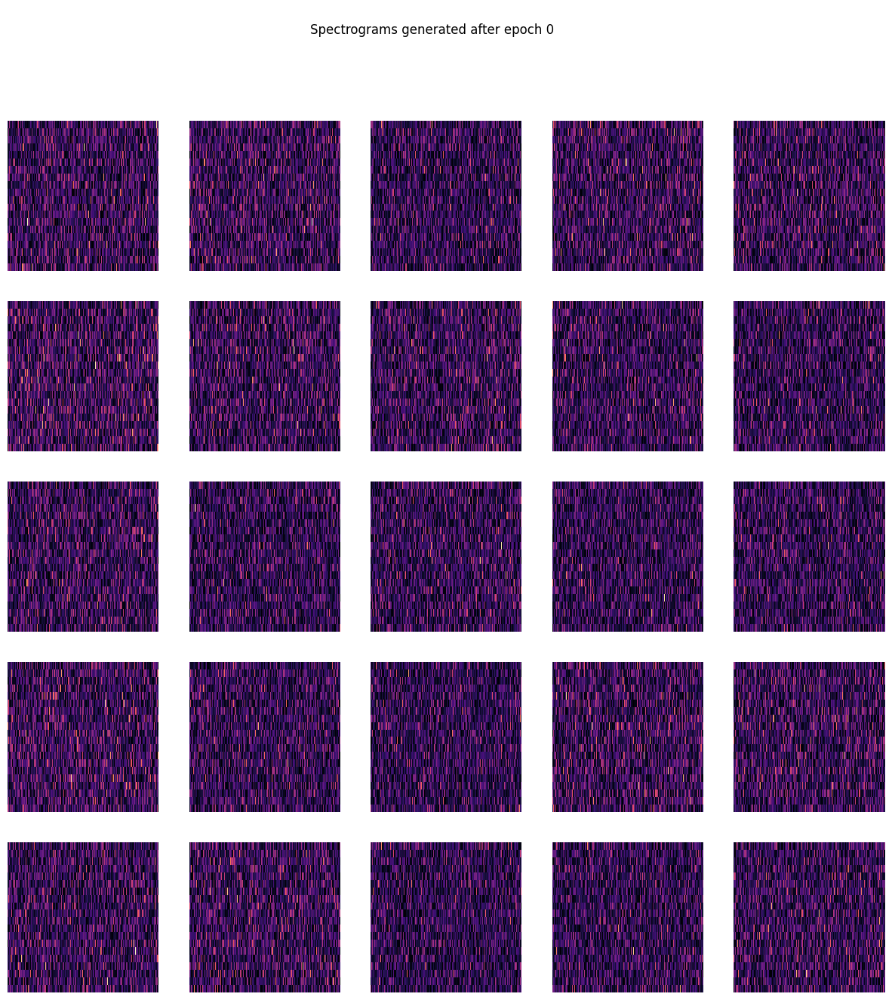

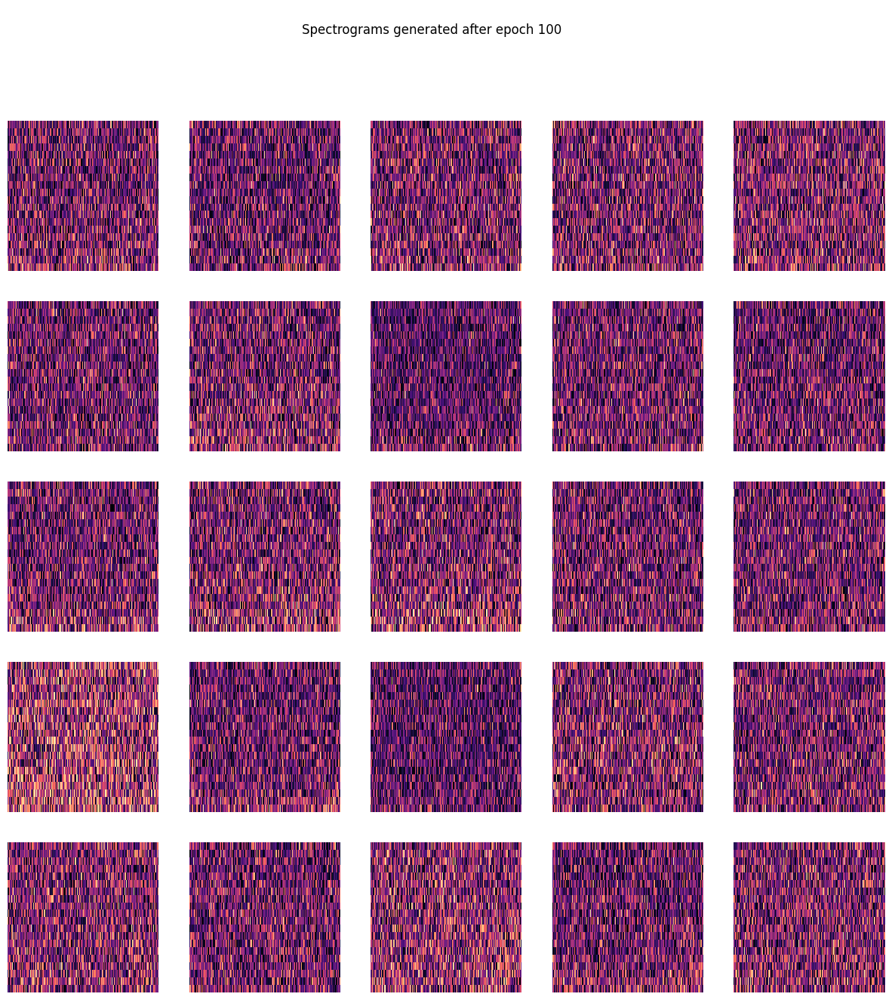

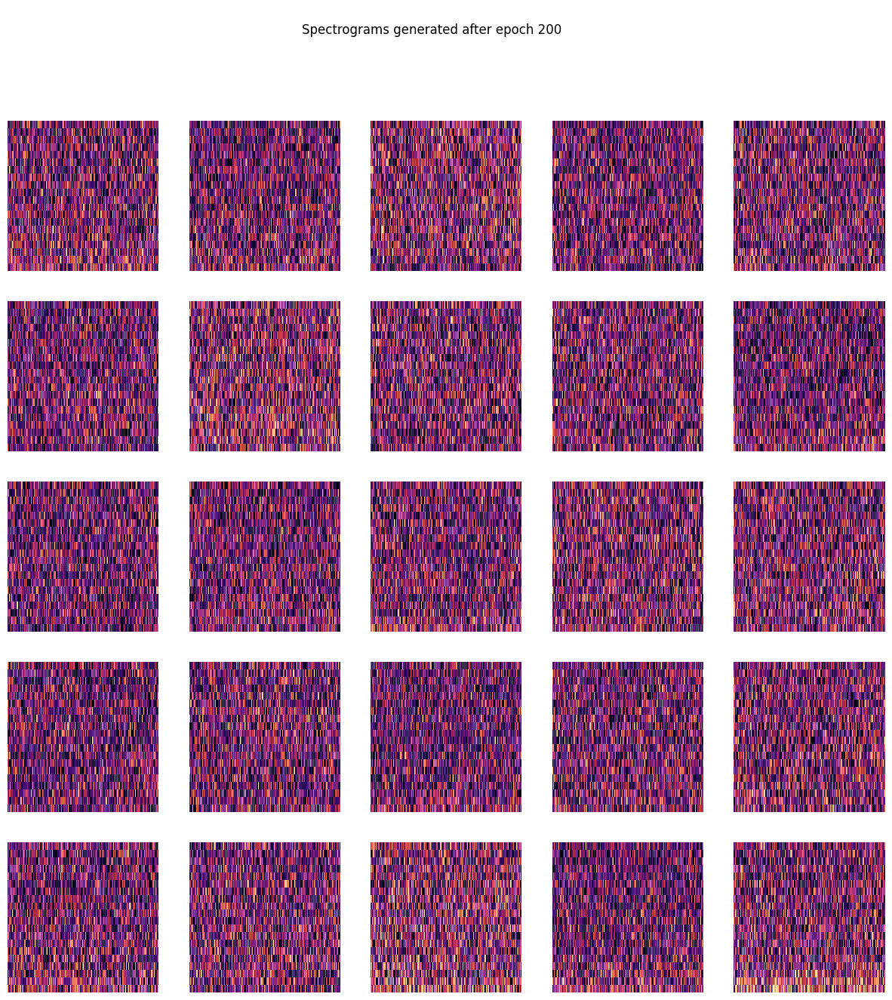

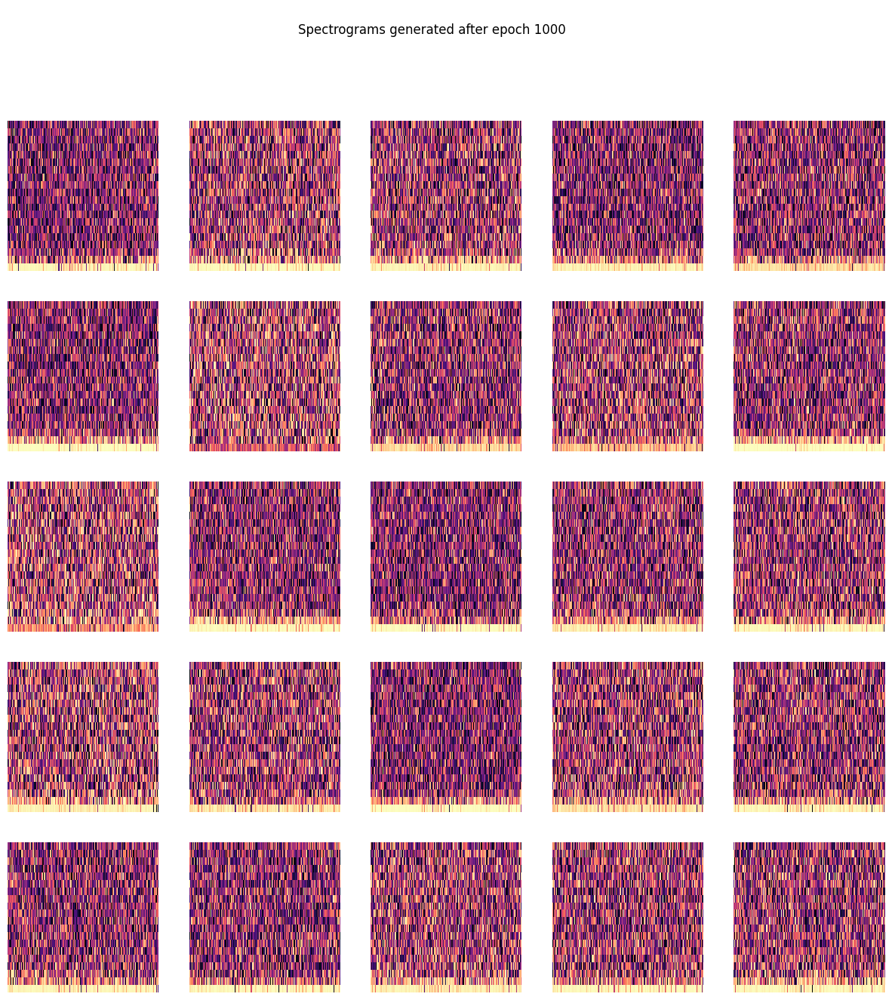

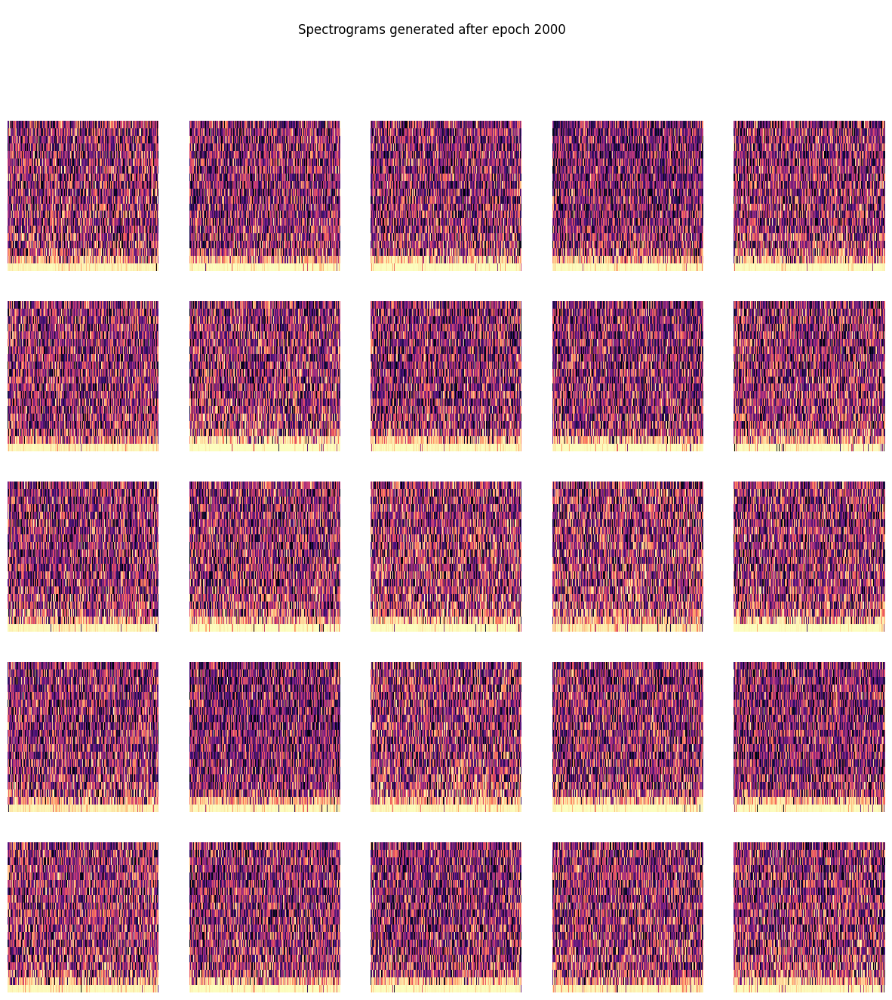

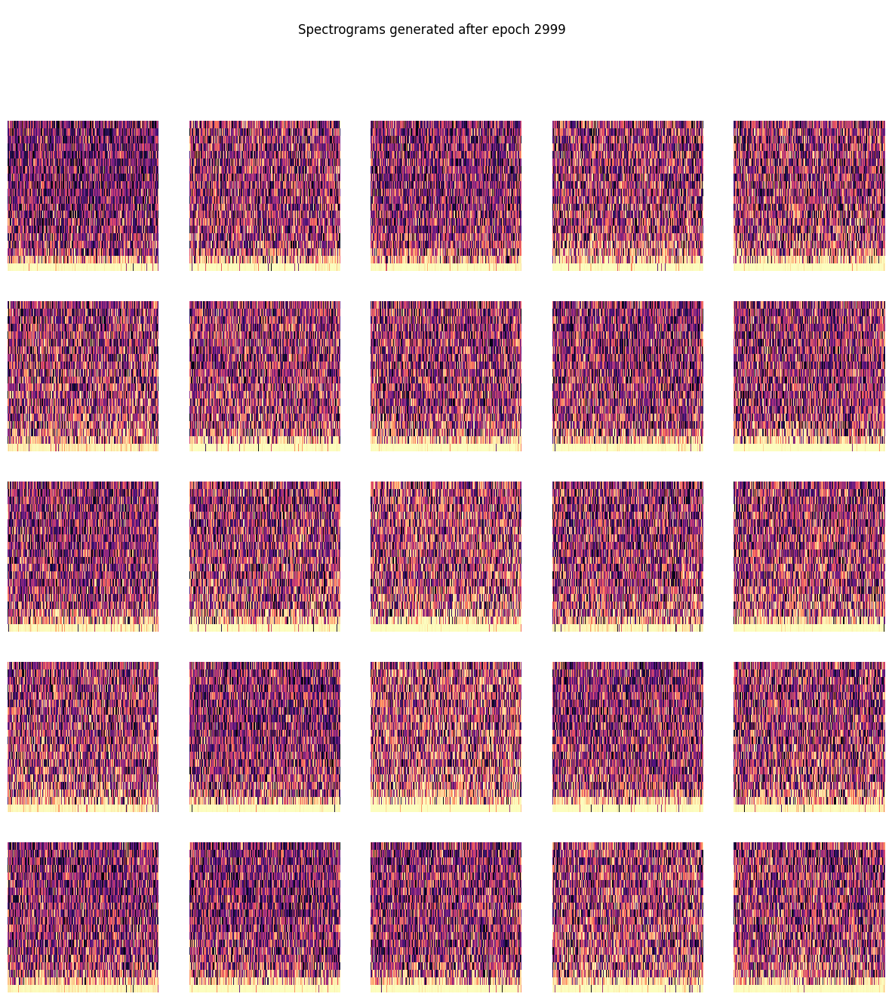

In [32]:
epochs = 3000
batch_size = 8

y_true = np.ones((batch_size,1))    # for real spectrograms the label will be 1
y_fake = np.zeros((batch_size,1))   # for fake spectrograms the label will be 0


for epoch in range(epochs):

    idx = np.random.randint(0, X_train_s.shape[0], batch_size)
    x_train_batch = X_train_s[idx]

    noise = np.random.normal(0,1,(batch_size,latent_dim))
    generated_spectrograms_s = generator_s.predict(noise)

    discriminator_loss_real = discriminator_s.train_on_batch(x_train_batch, y_true)
    discriminator_loss_fake = discriminator_s.train_on_batch(generated_spectrograms_s, y_fake)
    discriminator_loss = 0.5 * np.add(discriminator_loss_real, discriminator_loss_fake)
    
    noise = np.random.normal(0, 1, (batch_size, latent_dim))
    generator_loss = GAN_speech.train_on_batch(noise, y_true)
    
    print("Epoch %d/%d: - Discriminator_loss: %f, - Discriminator_accuracy: %.2f%% - Generator_loss: %f" %
          (epoch+1, epochs, discriminator_loss[0], 100*discriminator_loss[1], generator_loss))
    
    if epoch in [0, 100, 200, 1000, 2000, epochs-1]:
        show_generated_spectrograms(epoch, latent_dim, generator_s)
    
    

and the same with speech audio, let's generate some to our set (and see how discriminator works)

In [33]:
n = 64
latent_dim = 100
input_shape_s = (X_train_s.shape[1],X_train_s.shape[2],X_train_s.shape[3])

def generate_speech_with_GAN(n: int, latent_dim, input_shape, discriminator_s, generator_s):
    
    new_generated_speech = []
    count = 0
    for i in range(n):
        single_noise = np.random.normal(0,1, (1, latent_dim))
        
        generated_spectrogram = generator_s.predict(single_noise)
        generated_spectrogram = np.reshape(generated_spectrogram, (1,) + input_shape)

        
        [[discriminator_result]] = discriminator_s.predict(generated_spectrogram)
        if discriminator_result > 0.5:
            count += 1
        print(f'Generated music sound number {i}\n discriminator result: {discriminator_result}')
        
        new_generated_speech.append(generated_spectrogram[0,:,:,:])
    
    print(f'Number of discriminator mistakes (it classified generated sound as real): {count}')
    
    new_generated_music = np.array(new_generated_speech)

    return new_generated_music

new_generated_speech = generate_speech_with_GAN(n, latent_dim, input_shape_s, discriminator_s, generator_s)


1/1 [==============================] - 0s 81ms/step
Generated music sound number 0
 discriminator result: 0.0016363015165552497
1/1 [==============================] - 0s 29ms/step
Generated music sound number 1
 discriminator result: 1.0
1/1 [==============================] - 0s 35ms/step
Generated music sound number 2
 discriminator result: 6.901373637063066e-38
1/1 [==============================] - 0s 29ms/step
Generated music sound number 3
 discriminator result: 2.135267551648342e-35
1/1 [==============================] - 0s 27ms/step
Generated music sound number 4
 discriminator result: 1.0
1/1 [==============================] - 0s 29ms/step
Generated music sound number 5
 discriminator result: 5.7448592997388914e-05
1/1 [==============================] - 0s 30ms/step
Generated music sound number 6
 discriminator result: 0.3329758048057556
1/1 [==============================] - 0s 30ms/step
Generated music sound number 7
 discriminator result: 1.0
1/1 [===========================

In [34]:
evaluation_of_GAN(int(len(X_test_s[:,0,0,0])), X_test_s, generator_s, discriminator_s, input_shape=input_shape_s)


1/1 [==============================] - 0s 31ms/step
Real Correctly Classified Samples: 13
Real Incorrectly Classified Samples: 0
Generated Correctly Classified Samples: 9
Generated Incorrectly Classified Samples: 4


Preaparing new dataset with generated samples for classificator training:

As it can observe discriminator in GAN trained on speech data spectrograms makes mistakes more often than the one thained on music data. 

This observation may be influenced by a fact what kind of spectrogram we have used. MFCCs are the best for speech - as far as we researched it.

In [35]:
test_size=0.2
random_state=42

X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(dataset, labels, test_size=test_size, random_state=random_state)
X_train_new = X_train_new.reshape(X_train_new.shape[0], X_train_new.shape[1], X_train_new.shape[2], 1)
X_test_new = X_test_new.reshape(X_test_new.shape[0], X_test_new.shape[1], X_test_new.shape[2], 1)

X_train_new = np.concatenate([X_train_new, new_generated_music, new_generated_speech], axis=0)
y_train_new = np.concatenate([y_train_new, np.ones(len(new_generated_music[:,0,0,0])), np.zeros(len(new_generated_speech[:,0,0,0]))])


let's see how our model will be now:

Epoch 1/10
58/58 [==============================] - 3s 38ms/step - loss: 1.3243 - accuracy: 0.5174 - val_loss: 0.4469 - val_accuracy: 0.8462
Epoch 2/10
58/58 [==============================] - 2s 30ms/step - loss: 0.6168 - accuracy: 0.6130 - val_loss: 0.4555 - val_accuracy: 0.7308
Epoch 3/10
58/58 [==============================] - 2s 31ms/step - loss: 0.6528 - accuracy: 0.5957 - val_loss: 2.4554 - val_accuracy: 0.5000
Epoch 4/10
58/58 [==============================] - 2s 32ms/step - loss: 0.6763 - accuracy: 0.6435 - val_loss: 0.5548 - val_accuracy: 0.7308
Epoch 5/10
58/58 [==============================] - 2s 33ms/step - loss: 0.4759 - accuracy: 0.6696 - val_loss: 0.2513 - val_accuracy: 0.8846
Epoch 6/10
58/58 [==============================] - 2s 35ms/step - loss: 0.4601 - accuracy: 0.6957 - val_loss: 0.1835 - val_accuracy: 0.9231
Epoch 7/10
58/58 [==============================] - 2s 36ms/step - loss: 0.4678 - accuracy: 0.6913 - val_loss: 0.2626 - val_accuracy: 0.8846
Epoch 8/10
58

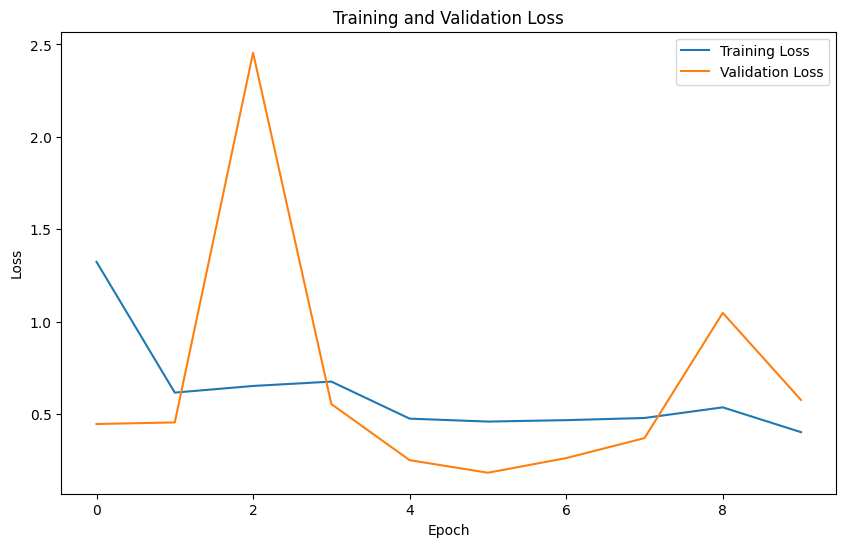

1/1 [==============================] - 0s 121ms/step
Accuracy: 0.9230769230769231
Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.85      0.92        13
         1.0       0.87      1.00      0.93        13

    accuracy                           0.92        26
   macro avg       0.93      0.92      0.92        26
weighted avg       0.93      0.92      0.92        26



In [36]:
input_shape_new = (X_train_new.shape[1],X_train_new.shape[2],X_train_new.shape[3])


model_new = simple_CNN_model(input_shape_new)
model_new.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history_new = model_new.fit(X_train_new, y_train_new, epochs=10, batch_size=4, validation_data=(X_test_new, y_test_new))

plt.figure(figsize=(10, 6))
plt.plot(history_new.history['loss'], label='Training Loss')
plt.plot(history_new.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

y_pred = (model_new.predict(X_test_new) > 0.5).astype("int32")
accuracy = accuracy_score(y_test_new, y_pred)
classification_rep = classification_report(y_test_new, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

When the datasets are prepared, now the main model can be improved.

In [59]:
def simple_CNN_model_new(input_shape):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(BatchNormalization())
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    return model

input_shape_new = (X_train_new.shape[1],X_train_new.shape[2],X_train_new.shape[3])
model_new = simple_CNN_model_new(input_shape_new)



Epoch 1/25
29/29 [==============================] - 5s 102ms/step - loss: 2.3569 - accuracy: 0.4957 - val_loss: 14.5559 - val_accuracy: 0.5000
Epoch 2/25
29/29 [==============================] - 3s 89ms/step - loss: 0.7121 - accuracy: 0.7609 - val_loss: 0.3983 - val_accuracy: 0.8077
Epoch 3/25
29/29 [==============================] - 3s 91ms/step - loss: 0.4710 - accuracy: 0.8739 - val_loss: 1.3495 - val_accuracy: 0.7308
Epoch 4/25
29/29 [==============================] - 3s 91ms/step - loss: 0.2281 - accuracy: 0.9174 - val_loss: 0.5611 - val_accuracy: 0.8077
Epoch 5/25
29/29 [==============================] - 3s 92ms/step - loss: 0.1051 - accuracy: 0.9696 - val_loss: 0.3946 - val_accuracy: 0.8077
Epoch 6/25
29/29 [==============================] - 3s 90ms/step - loss: 0.0815 - accuracy: 0.9826 - val_loss: 0.2619 - val_accuracy: 0.9615
Epoch 7/25
29/29 [==============================] - 3s 102ms/step - loss: 0.0380 - accuracy: 0.9826 - val_loss: 0.4948 - val_accuracy: 0.8846
Epoch 8/25

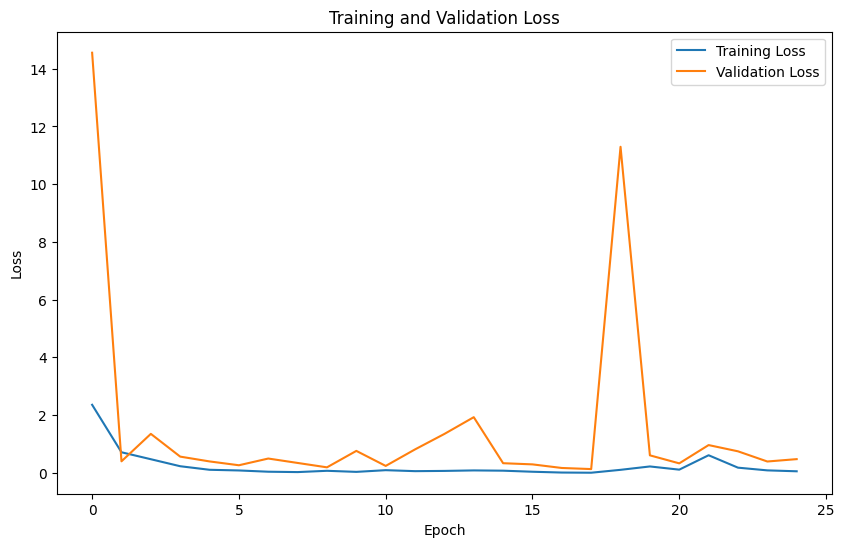

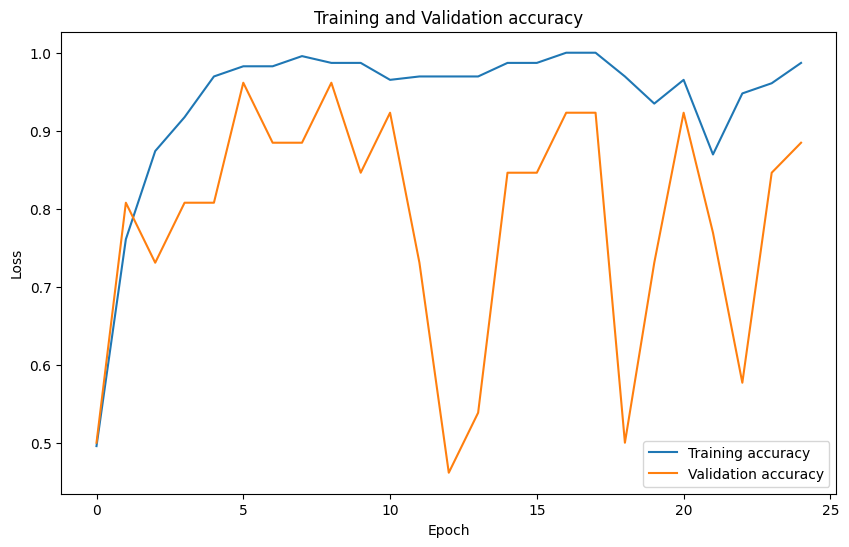

1/1 [==============================] - 0s 158ms/step
Accuracy: 0.8846153846153846
Classification Report:
               precision    recall  f1-score   support

         0.0       0.86      0.92      0.89        13
         1.0       0.92      0.85      0.88        13

    accuracy                           0.88        26
   macro avg       0.89      0.88      0.88        26
weighted avg       0.89      0.88      0.88        26



In [60]:
model_new.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history_new = model_new.fit(X_train_new, y_train_new, epochs=25, batch_size=8, validation_data=(X_test_new, y_test_new))

plt.figure(figsize=(10, 6))
plt.plot(history_new.history['loss'], label='Training Loss')
plt.plot(history_new.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(history_new.history['accuracy'], label='Training accuracy')
plt.plot(history_new.history['val_accuracy'], label='Validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
y_pred = (model_new.predict(X_test_new) > 0.5).astype("int32")
accuracy = accuracy_score(y_test_new, y_pred)
classification_rep = classification_report(y_test_new, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

In [61]:
loss_val, acc_val = model_new.evaluate(X_test_new,y_test_new)

1/1 [==============================] - 0s 74ms/step - loss: 0.4739 - accuracy: 0.8846


In [78]:
def simple_CNN_model_new2(input_shape):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2,2)))
    
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    
    model.add(MaxPooling2D(pool_size=(2,2)))
    
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D(pool_size=(3,3)))

    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(BatchNormalization())

    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    return model

input_shape_new = (X_train_new.shape[1],X_train_new.shape[2],X_train_new.shape[3])
model_new2 = simple_CNN_model_new2(input_shape_new)

Epoch 1/25
29/29 [==============================] - ETA: 0s - loss: 2.5160 - accuracy: 0.5391
Epoch 1: val_loss improved from inf to 25.88354, saving model to model_checkpoint.h5
29/29 [==============================] - 6s 132ms/step - loss: 2.5160 - accuracy: 0.5391 - val_loss: 25.8835 - val_accuracy: 0.5000
Epoch 2/25


c:\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


29/29 [==============================] - ETA: 0s - loss: 1.2509 - accuracy: 0.6348
Epoch 2: val_loss improved from 25.88354 to 0.65737, saving model to model_checkpoint.h5
29/29 [==============================] - 4s 126ms/step - loss: 1.2509 - accuracy: 0.6348 - val_loss: 0.6574 - val_accuracy: 0.6923
Epoch 3/25
29/29 [==============================] - ETA: 0s - loss: 0.9775 - accuracy: 0.6783
Epoch 3: val_loss did not improve from 0.65737
29/29 [==============================] - 3s 120ms/step - loss: 0.9775 - accuracy: 0.6783 - val_loss: 5.6595 - val_accuracy: 0.5000
Epoch 4/25
29/29 [==============================] - ETA: 0s - loss: 0.6311 - accuracy: 0.7739
Epoch 4: val_loss did not improve from 0.65737
29/29 [==============================] - 3s 117ms/step - loss: 0.6311 - accuracy: 0.7739 - val_loss: 0.6686 - val_accuracy: 0.5769
Epoch 5/25
29/29 [==============================] - ETA: 0s - loss: 0.3653 - accuracy: 0.8739
Epoch 5: val_loss improved from 0.65737 to 0.57449, saving 

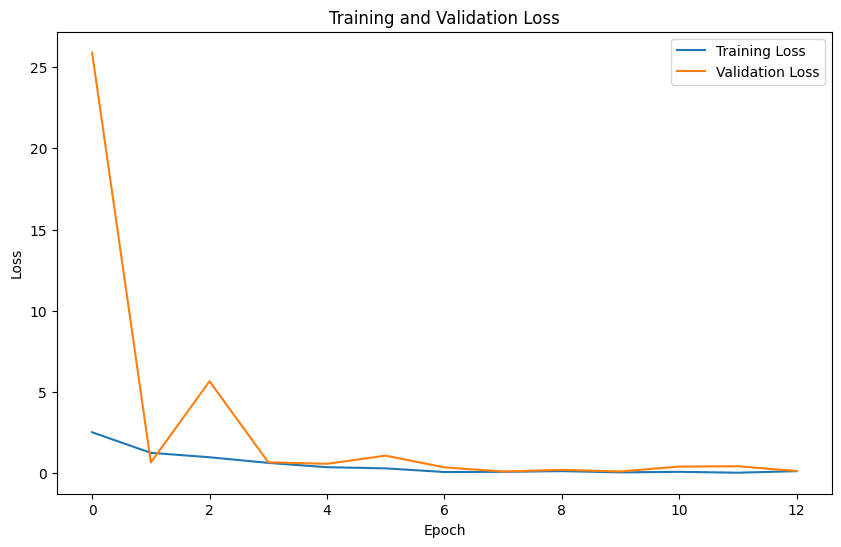

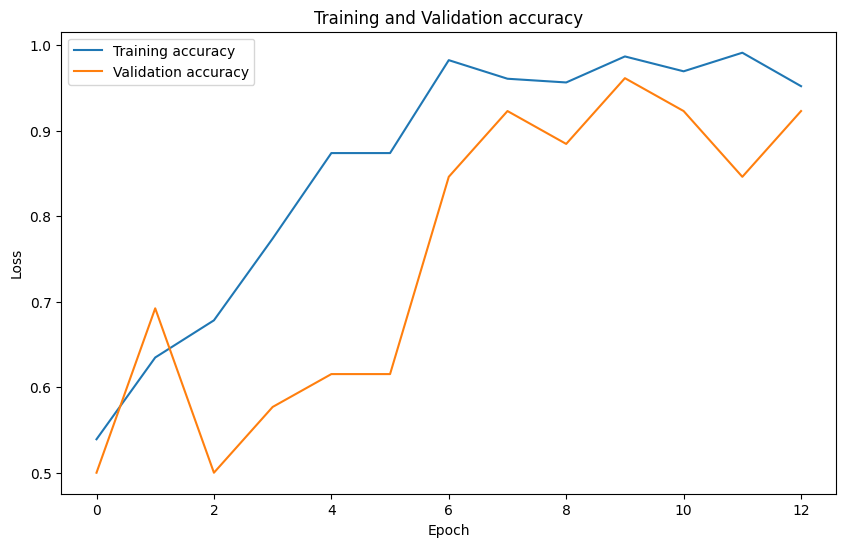

1/1 [==============================] - 0s 216ms/step
Accuracy: 0.9230769230769231
Classification Report:
               precision    recall  f1-score   support

         0.0       1.00      0.85      0.92        13
         1.0       0.87      1.00      0.93        13

    accuracy                           0.92        26
   macro avg       0.93      0.92      0.92        26
weighted avg       0.93      0.92      0.92        26



In [79]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
checkpoint = ModelCheckpoint('model_checkpoint.h5', monitor='val_loss', save_best_only=True, verbose=1)

model_new2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

history_new = model_new2.fit(X_train_new, y_train_new, epochs=25, batch_size=8, validation_data=(X_test_new, y_test_new), callbacks=[checkpoint, early_stopping])

plt.figure(figsize=(10, 6))
plt.plot(history_new.history['loss'], label='Training Loss')
plt.plot(history_new.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.plot(history_new.history['accuracy'], label='Training accuracy')
plt.plot(history_new.history['val_accuracy'], label='Validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
y_pred = (model_new2.predict(X_test_new) > 0.5).astype("int32")
accuracy = accuracy_score(y_test_new, y_pred)
classification_rep = classification_report(y_test_new, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

In [80]:
loss_val, acc_val = model_new2.evaluate(X_test_new,y_test_new)

1/1 [==============================] - 0s 101ms/step - loss: 0.1016 - accuracy: 0.9231


**Conclusions:**
- Investigation of the performance of each GAN model - due to a fact that obtaining a good GAN model requires a huge amount of data, resources and time (which we do not have), generated spectrograms do not imitate a real one properly. But still discriminator sometimes wasn't able to distinguish real data from the generated ones. 
- Also performance of the GAN models was indeed a bit better after reducing the diversity among the dataset (training the model only on one type of data - music or speech).
- Tries of obtaining the best CNN model for classification, the issues which appeared during the proces was: 
    - overfitting - the problem was solved with use the dropout and reducing the complexity of the model - but then another issue appeared,
    - training of the model was very unstable - single and high fluctuations could be observed in loss values for training and validation, even if the training itself seemed to give a nice results. The batch normalization solved the problem.
    - to prevent overfiting some callbacks methods were used - checkpoint and early stopping.


Overall, the model trained on the original and generated data has a good performance - it obtained over 90% in accuracy score, it is not over or underfitted.